# Description

Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition?

Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

We have many features which reflect an employees journey in the organisation. Some of the features are more responsible for attrition then other and vice versa.

On the basis of these features we have to train a model which can predict whther the employee will leave or stay.

 

In [1]:
# Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [137]:
hrdata=pd.read_csv('HR-Employee-Attrition.csv')

In [3]:
pd.set_option('display.max_rows',None)

In [4]:
pd.set_option('display.max_columns',None)

In [5]:
hrdata.head(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,4,Male,67,3,1,Laboratory Technician,3,Divorced,2693,13335,1,Y,No,22,4,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,4,Male,44,2,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,3,Male,94,3,2,Healthcare Representative,3,Married,5237,16577,6,Y,No,13,3,2,80,2,17,3,2,7,7,7,7


In [6]:
hrdata.shape

(1470, 35)

In [7]:
hrdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [8]:
hrdata.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

# Checking Missing and Null Values

In [125]:
hrdata.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [126]:
hrdata.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

No null values are present. Making separate dataframes for Categorical and Numerical columns respectively for analysis

In [11]:
# Categorical Columns

hrdata_cat=hrdata.select_dtypes(include='object')

In [12]:
hrdata_cat

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
5,No,Travel_Frequently,Research & Development,Life Sciences,Male,Laboratory Technician,Single,Y,No
6,No,Travel_Rarely,Research & Development,Medical,Female,Laboratory Technician,Married,Y,Yes
7,No,Travel_Rarely,Research & Development,Life Sciences,Male,Laboratory Technician,Divorced,Y,No
8,No,Travel_Frequently,Research & Development,Life Sciences,Male,Manufacturing Director,Single,Y,No
9,No,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No


In [13]:
# Numerical Columns

hrdata_num = hrdata.select_dtypes(include='int64')

In [14]:
hrdata_num

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,2,1,1,2,94,3,2,4,5993,19479,8,11,3,1,80,0,8,0,1,6,4,0,5
1,49,279,8,1,1,2,3,61,2,2,2,5130,24907,1,23,4,4,80,1,10,3,3,10,7,1,7
2,37,1373,2,2,1,4,4,92,2,1,3,2090,2396,6,15,3,2,80,0,7,3,3,0,0,0,0
3,33,1392,3,4,1,5,4,56,3,1,3,2909,23159,1,11,3,3,80,0,8,3,3,8,7,3,0
4,27,591,2,1,1,7,1,40,3,1,2,3468,16632,9,12,3,4,80,1,6,3,3,2,2,2,2
5,32,1005,2,2,1,8,4,79,3,1,4,3068,11864,0,13,3,3,80,0,8,2,2,7,7,3,6
6,59,1324,3,3,1,10,3,81,4,1,1,2670,9964,4,20,4,1,80,3,12,3,2,1,0,0,0
7,30,1358,24,1,1,11,4,67,3,1,3,2693,13335,1,22,4,2,80,1,1,2,3,1,0,0,0
8,38,216,23,3,1,12,4,44,2,3,3,9526,8787,0,21,4,2,80,0,10,2,3,9,7,1,8
9,36,1299,27,3,1,13,3,94,3,2,3,5237,16577,6,13,3,2,80,2,17,3,2,7,7,7,7


# Univariate Analysis

# Exploring Categorical columns

In [15]:
# Checking Unique Values
for c in hrdata_cat.columns:
    print(f'{c} : {hrdata_cat[c].unique()} ')
    print('*********************************')


Attrition : ['Yes' 'No'] 
*********************************
BusinessTravel : ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel'] 
*********************************
Department : ['Sales' 'Research & Development' 'Human Resources'] 
*********************************
EducationField : ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources'] 
*********************************
Gender : ['Female' 'Male'] 
*********************************
JobRole : ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources'] 
*********************************
MaritalStatus : ['Single' 'Married' 'Divorced'] 
*********************************
Over18 : ['Y'] 
*********************************
OverTime : ['Yes' 'No'] 
*********************************


In [28]:
# Checking Value Counts

for v in hrdata_cat.columns:
    print(f'{v} : \n {hrdata_cat[v].value_counts()} ')
    print('_______________________________________')

Attrition : 
 No     1233
Yes     237
Name: Attrition, dtype: int64 
_______________________________________
BusinessTravel : 
 Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64 
_______________________________________
Department : 
 Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64 
_______________________________________
EducationField : 
 Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64 
_______________________________________
Gender : 
 Male      882
Female    588
Name: Gender, dtype: int64 
_______________________________________
JobRole : 
 Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager           

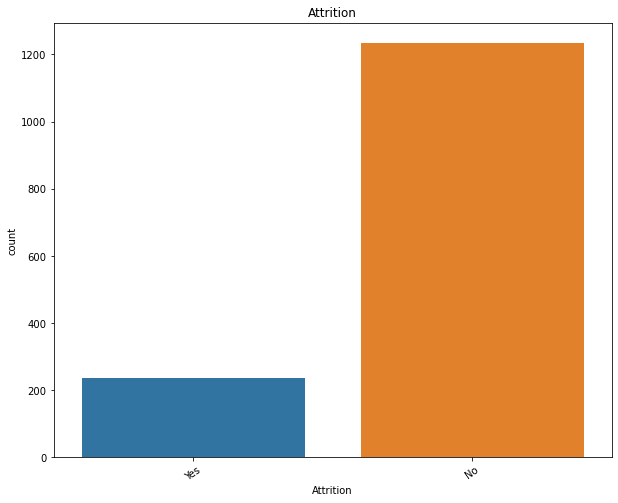

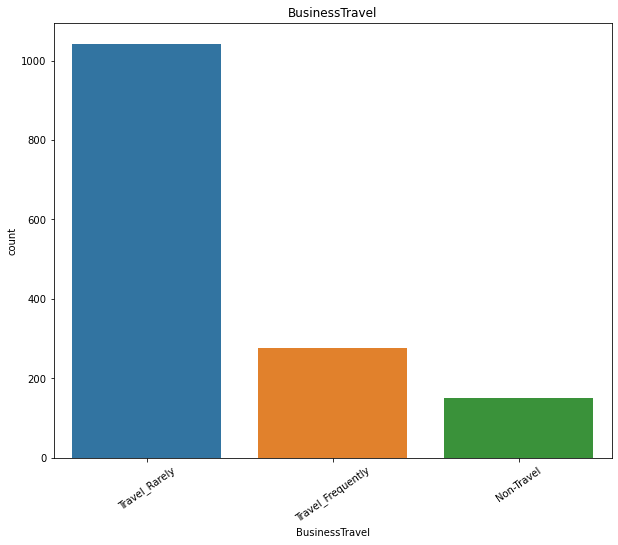

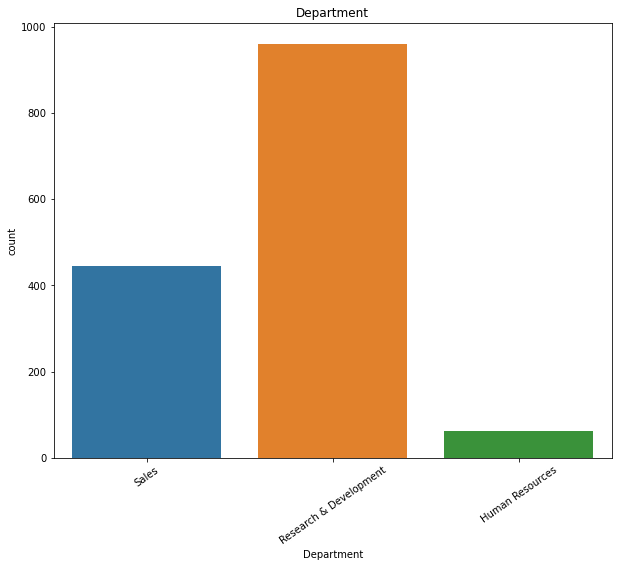

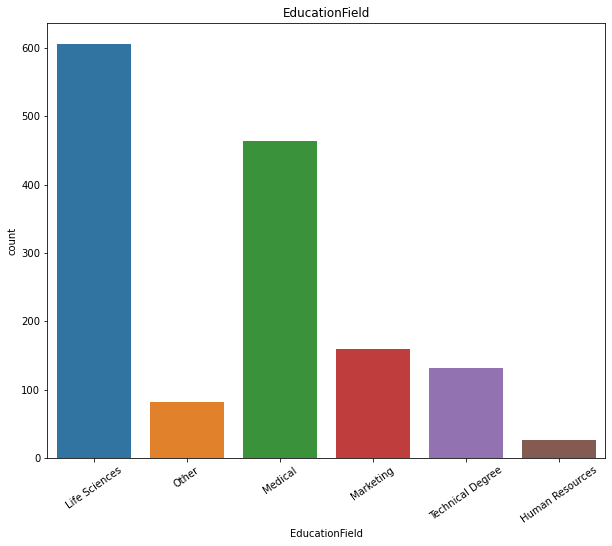

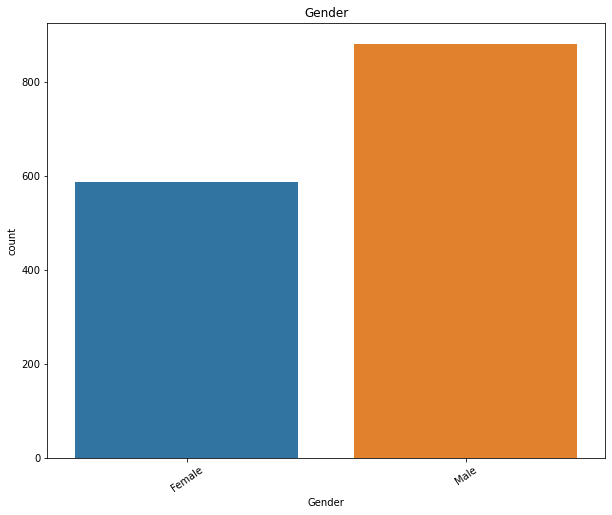

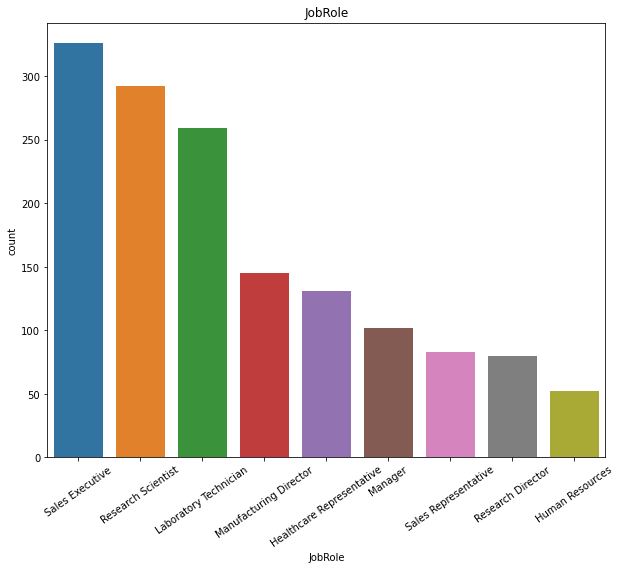

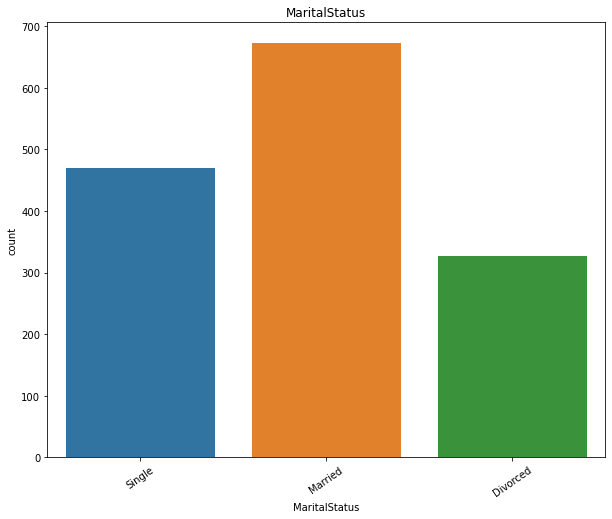

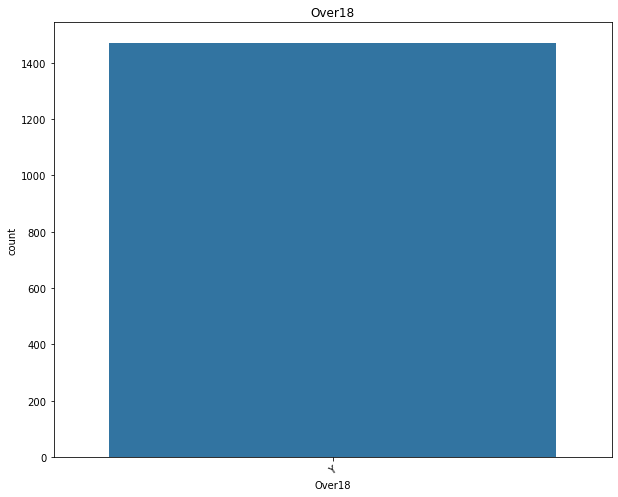

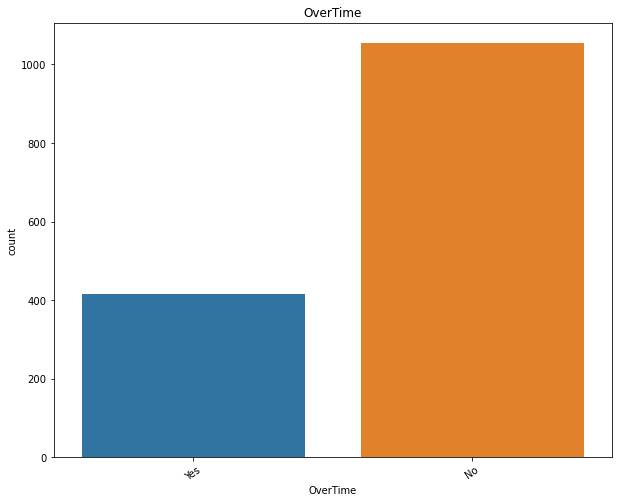

In [16]:
# Visualizing counts

for i in hrdata_cat.columns:
    plt.figure(figsize=(10,8))
    sns.countplot(hrdata_cat[i])
    plt.title(i)
    plt.xticks(rotation=35)
    plt.show()

Observations

1. From the total number of employees, around 83.88% stay in the company while 16.12% ought to leave.
2. A maximum number of employees travel rarely.
3. 65% of employees are in the Research snd Development department. This also shows that the company's interest in new research    and findings is high.
4. Employees having an educational background in Life Sciences and Medical is high.
5. The male and Female count doesn't show any biased towards any particular gender.
6. The company has a high number of sales executives.
7. 45.7%  of employees are married while 31.9% and 22.2%  are single and divorced respectively.
8. 71% of employees do not do overtime while only 28% prefer it.

# Exploring Numerical columns

In [17]:
hrdata_num.columns

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [18]:
hrdata_num.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


As observed difference between mean and 50th percentile is observed in some columns.
There is a difference between Max and 75th percentile value in monthly income column. We will observe these values further while detecting Outliers.

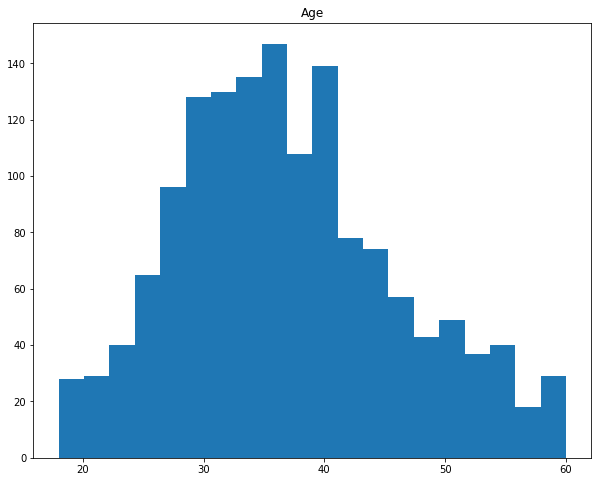

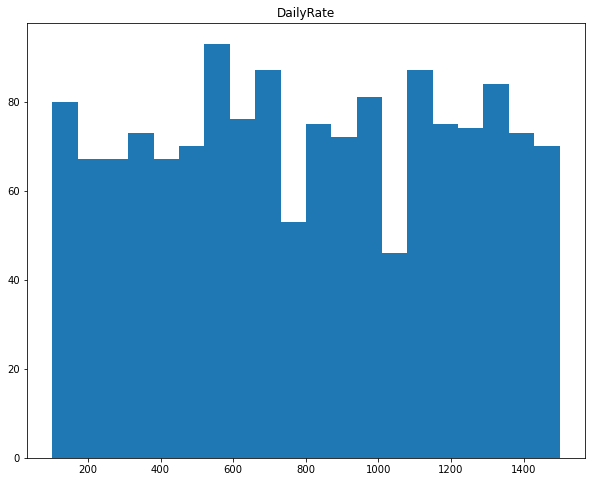

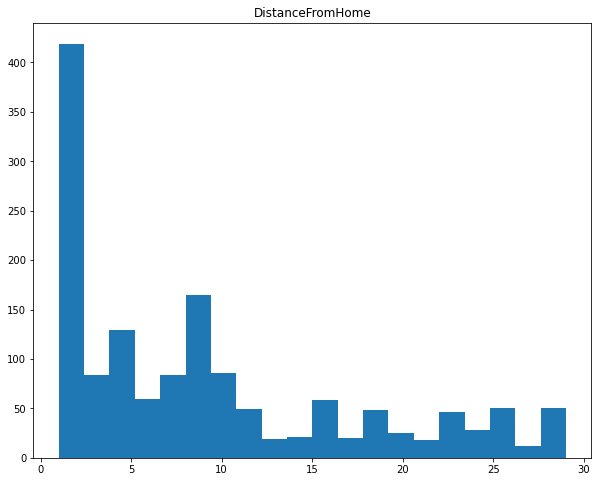

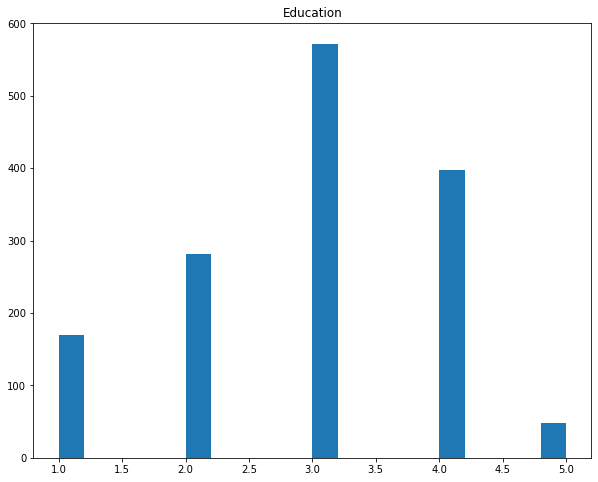

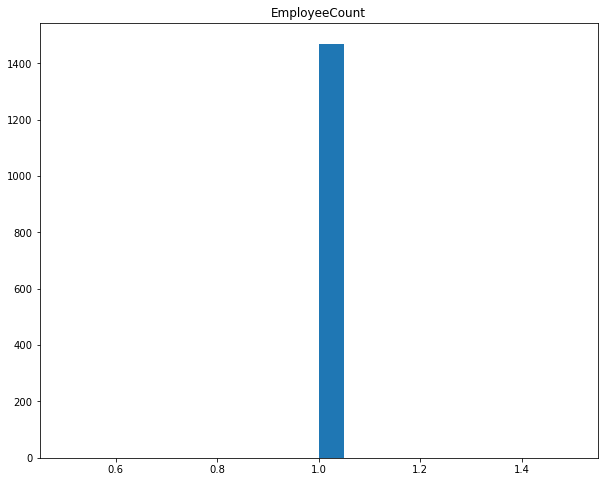

...

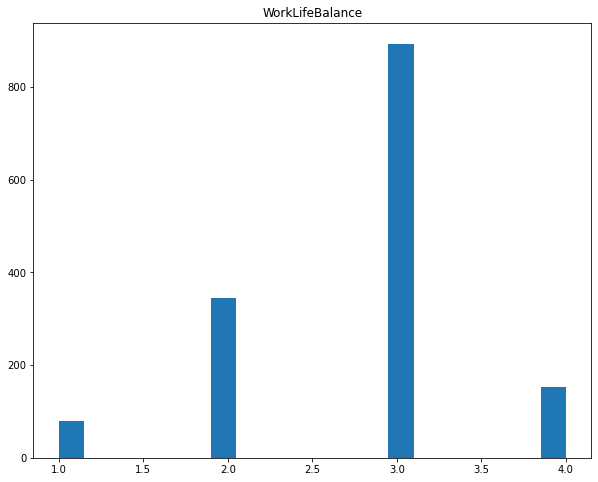

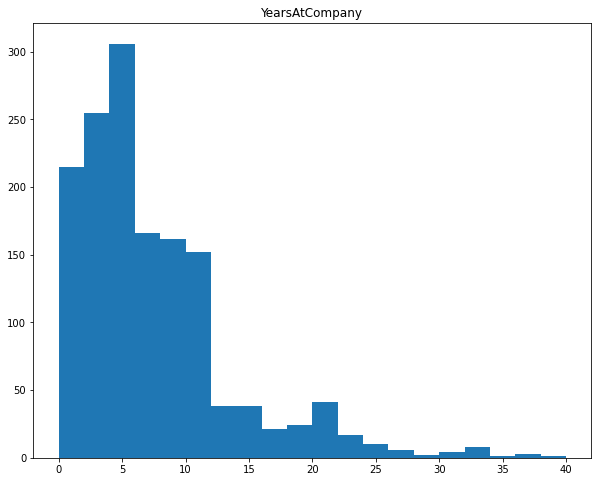

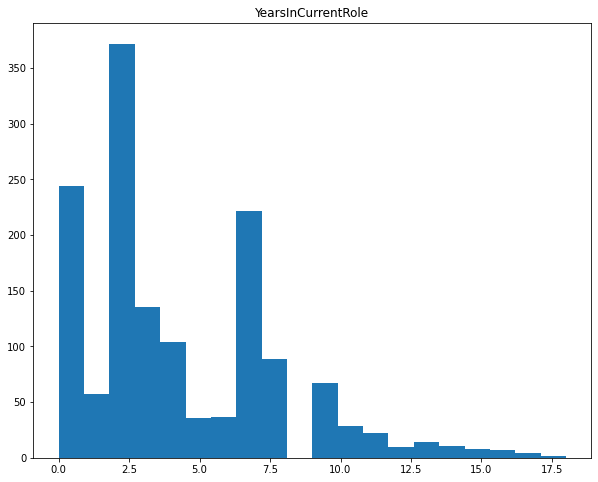

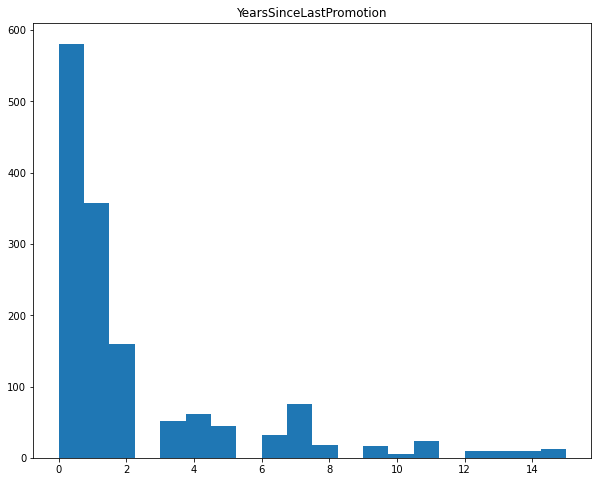

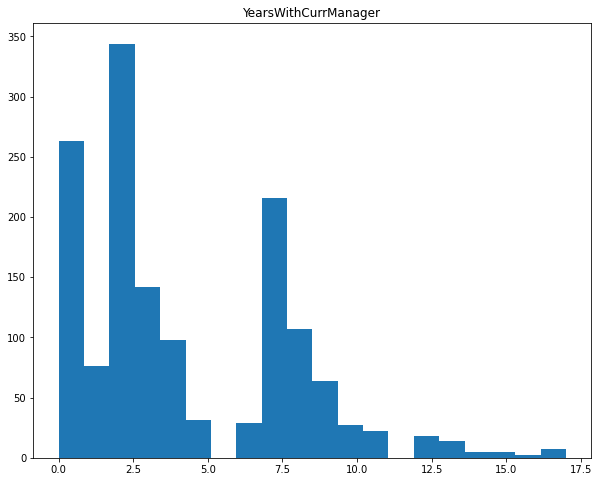

In [21]:
for d in hrdata_num.columns:
    plt.figure(figsize=(10,8))
    plt.title(d)
    plt.hist(hrdata_num[d],bins=20)
    plt.show()

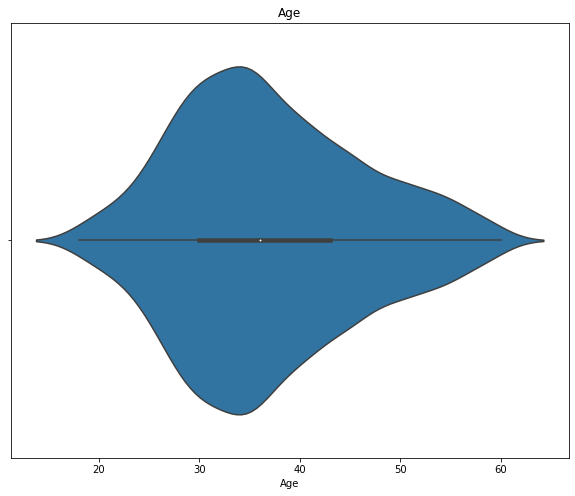

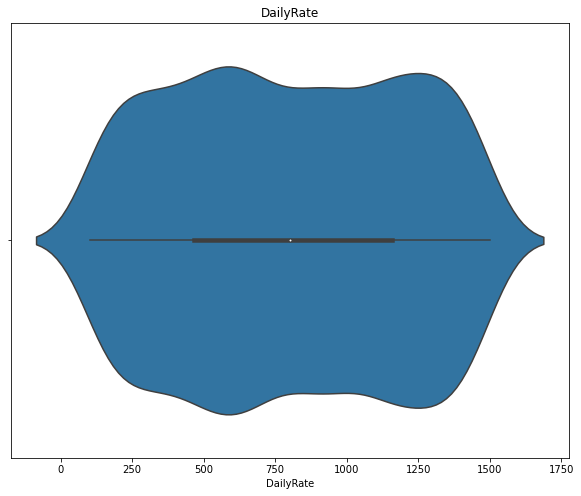

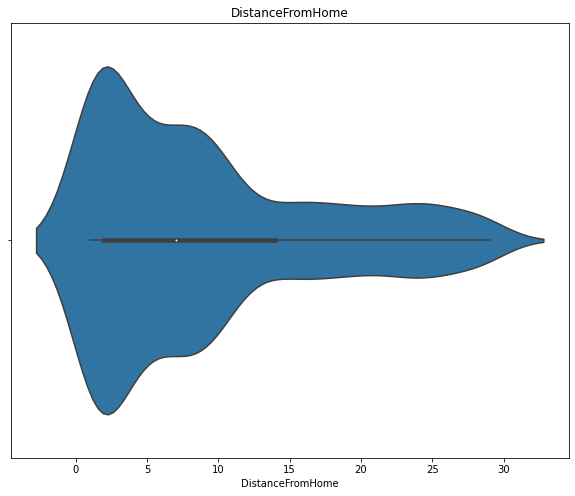

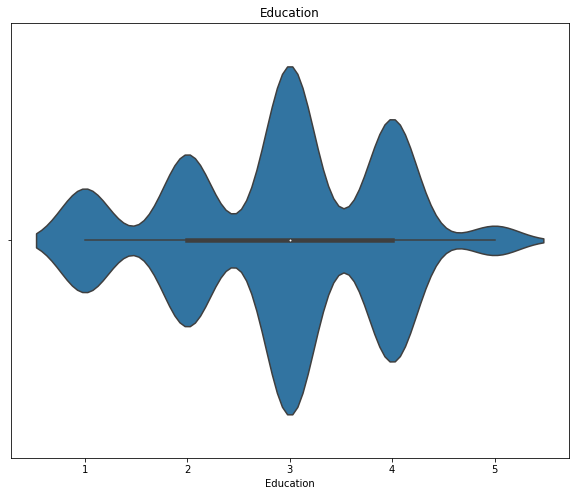

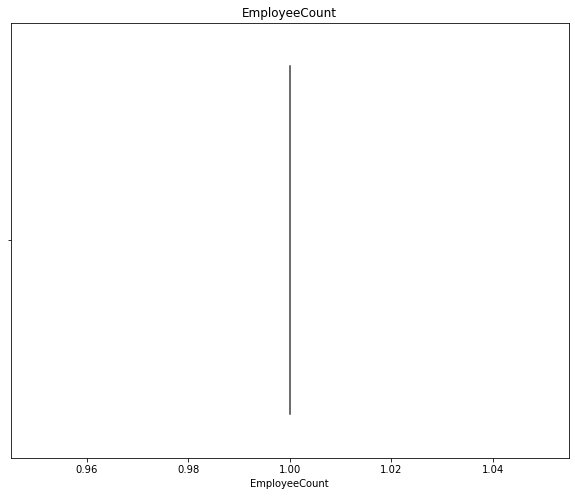

...

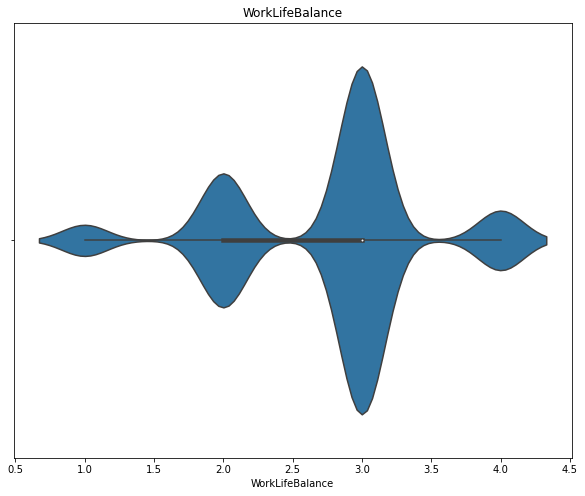

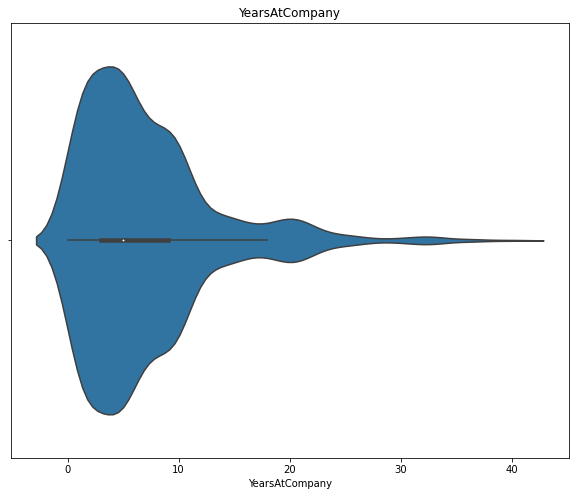

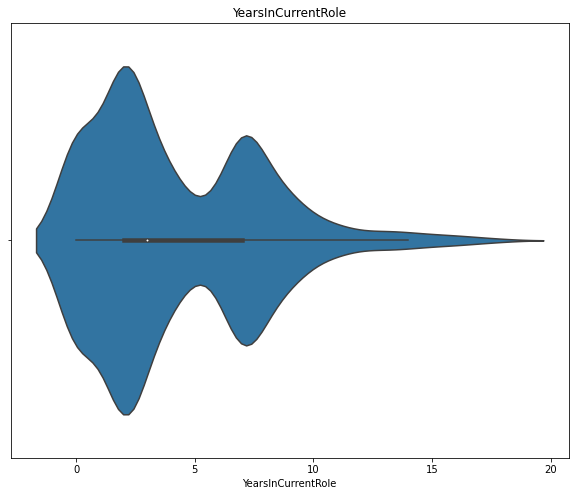

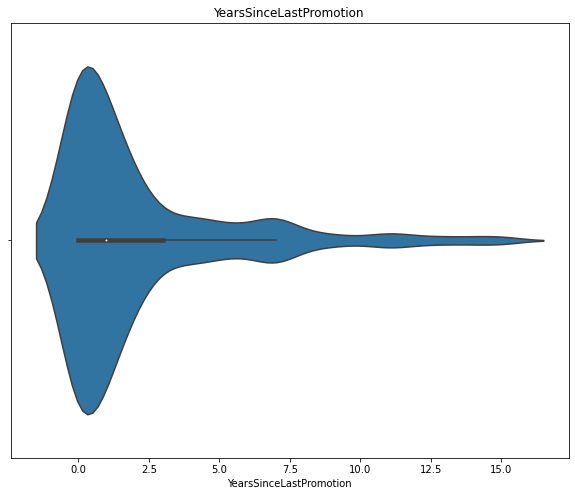

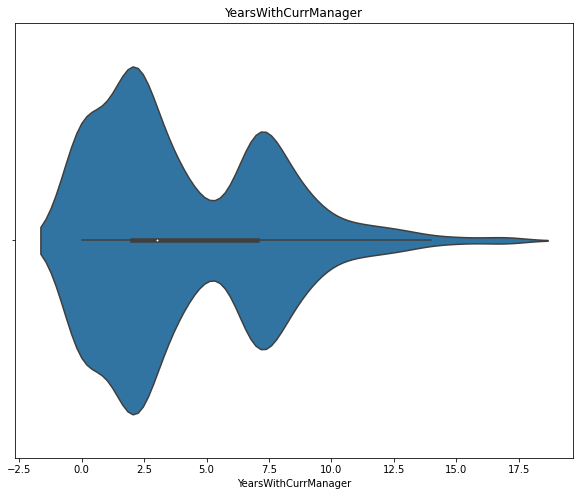

In [25]:
for d in hrdata_num.columns:
    plt.figure(figsize=(10,8))
    plt.title(d)
    sns.violinplot(hrdata_num[d])
    plt.show()

Observations

1. A maximum number of employees are between age group 28 to 40. Avergage age of employees is 36 yrs.
2. Daily rate of maximum number of employees employees is spread between 170 to 1350.
3. Maximum employees has office from home at a distance of 1-2 kms.
4. 38% employees has education level at 3 followed by 27% at level 4.
5. 30.8% employees has Environment Satisfaction at level 3.0 while 30.3% has 4.0.
6. 59% employees has Job Involvement level at 3.0.
7. Majority of employees has job level at 1 and 2. 36.9% are at level 1 while 36.3% are at level 2.
8. 61.2% employees has job satisfaction level at 4 and 3. Higher job satisfaction shows less posibility of attrition.
9. Maximum Employees has Monthly Income between 2000 to 7000. Considerable employees are at 10000 Income range as well.
10. Maximum employees i.e. 35.4% employess have worked with a single company only.
11. A hike in salary at a rate of 12-14% is observed the most. 16-18% hike is also given a lot of times.
12. 84.6% employees has performance rating of 3.0 while only 15.37% could perform at 4.0
13. 31% has relationship satisfaction at 3.0 while 29.3% is at 4.0.
14. 47.2% of the total employees has work experience between 5 to 10 years. 13% alone has experience for 10 years.
15. 60.7% employees has worklife balance at level 3.0.

# Bivariate Analysis

Impact of Numerical Columns on Attrition.


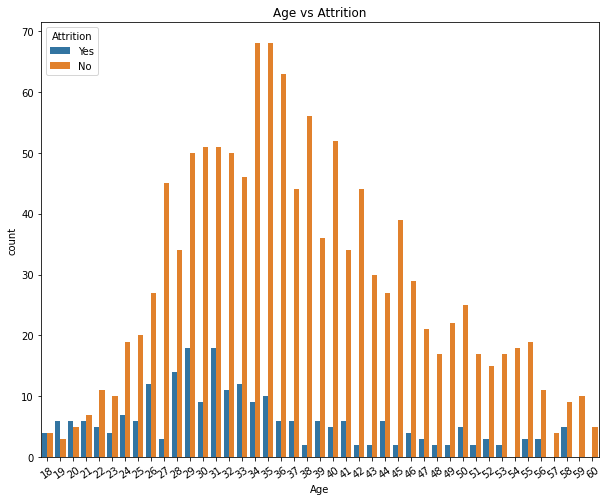

In [60]:
plt.figure(figsize=(10,8))
sns.countplot(x=hrdata_num['Age'],hue=hrdata_cat['Attrition'])
plt.title('Age vs Attrition')
plt.xticks(rotation=35)
plt.show()

Eployees between age 34-36 are very likely to stay. Employees above 45 years show very possibility of attrition.
On the other hand employees of age group 28-31 are very likely to leave.

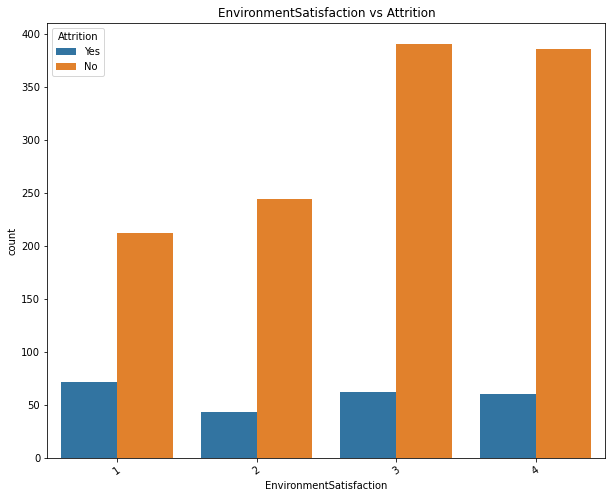

In [66]:
plt.figure(figsize=(10,8))
sns.countplot(x=hrdata_num['EnvironmentSatisfaction'],hue=hrdata_cat['Attrition'])
plt.title('EnvironmentSatisfaction vs Attrition')
plt.xticks(rotation=35)
plt.show()

Employees with less Environment Satisfactiobn are more likely to leave.

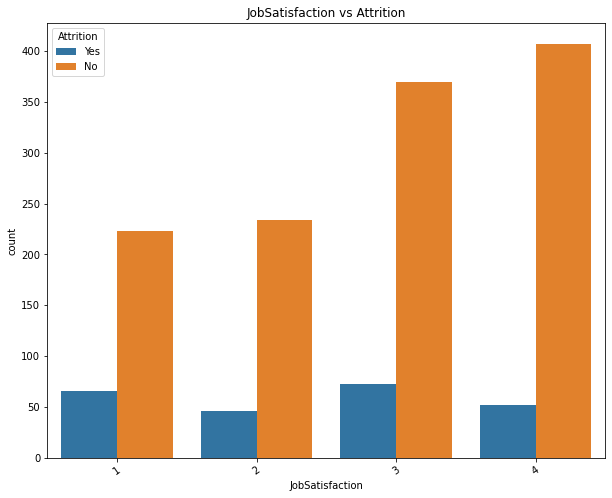

In [72]:
plt.figure(figsize=(10,8))
sns.countplot(x=hrdata_num['JobSatisfaction'],hue=hrdata_cat['Attrition'])
plt.title('JobSatisfaction vs Attrition')
plt.xticks(rotation=35)
plt.show()

In [69]:
pd.crosstab(hrdata_num['JobSatisfaction'],hrdata_cat['Attrition'])

Attrition,No,Yes
JobSatisfaction,,
1,223,66
2,234,46
3,369,73
4,407,52


Higher percemtage of attrition is observed at lower job satisfaction level. 22.8% of the employees having level at 1.0 are likely to leave 

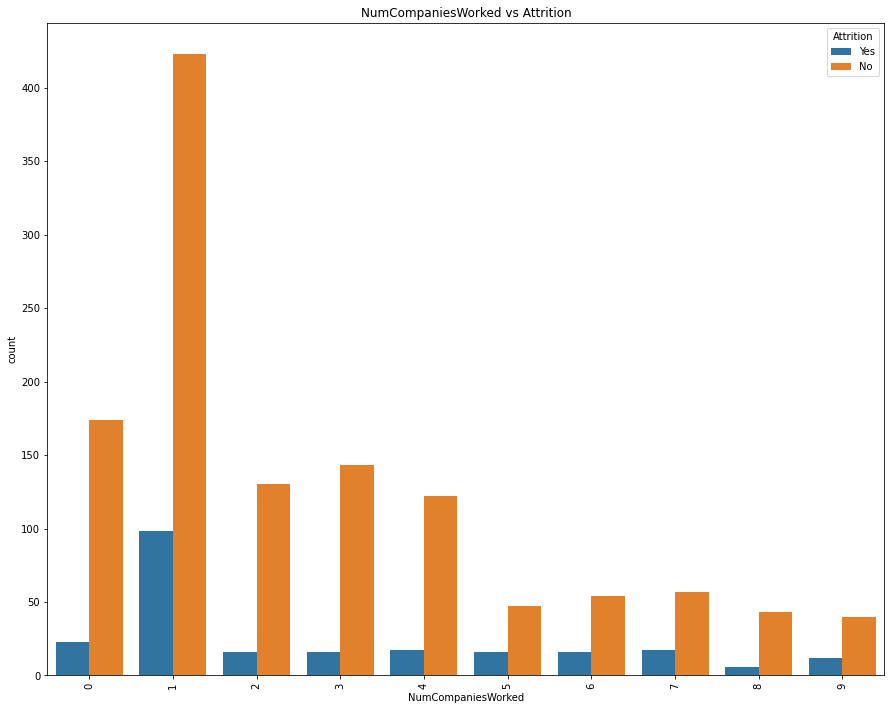

In [81]:
plt.figure(figsize=(15,12))
sns.countplot(x=hrdata_num['NumCompaniesWorked'],hue=hrdata_cat['Attrition'])
plt.title('NumCompaniesWorked vs Attrition')
plt.xticks(rotation=90)
plt.show()

Employees who have worked with a single company are more likely to leave. While this percentage is less in freahers.

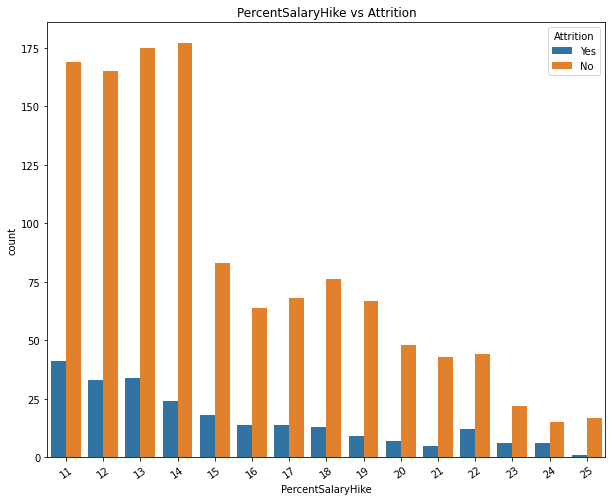

In [82]:
plt.figure(figsize=(10,8))
sns.countplot(x=hrdata_num['PercentSalaryHike'],hue=hrdata_cat['Attrition'])
plt.title('PercentSalaryHike vs Attrition')
plt.xticks(rotation=35)
plt.show()

Employees with less hike in salary are more likely to leave

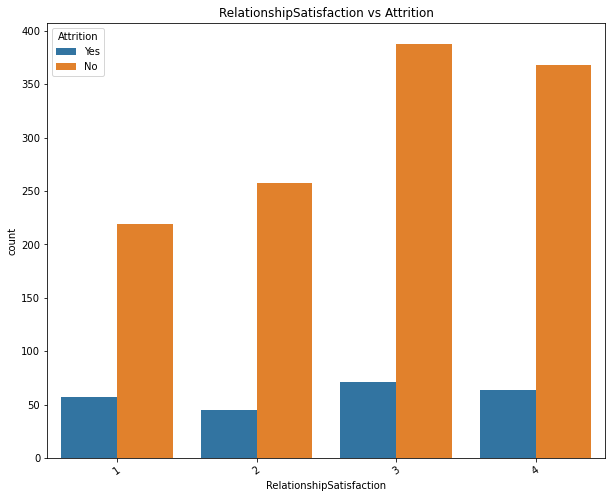

In [84]:
plt.figure(figsize=(10,8))
sns.countplot(x=hrdata_num['RelationshipSatisfaction'],hue=hrdata_cat['Attrition'])
plt.title('RelationshipSatisfaction vs Attrition')
plt.xticks(rotation=35)
plt.show()

In [85]:
pd.crosstab(hrdata_num['RelationshipSatisfaction'],hrdata_cat['Attrition'])

Attrition,No,Yes
RelationshipSatisfaction,,
1,219,57
2,258,45
3,388,71
4,368,64


Highest percentage pf attrition which is 20% is with employees having low relationship satisfacation

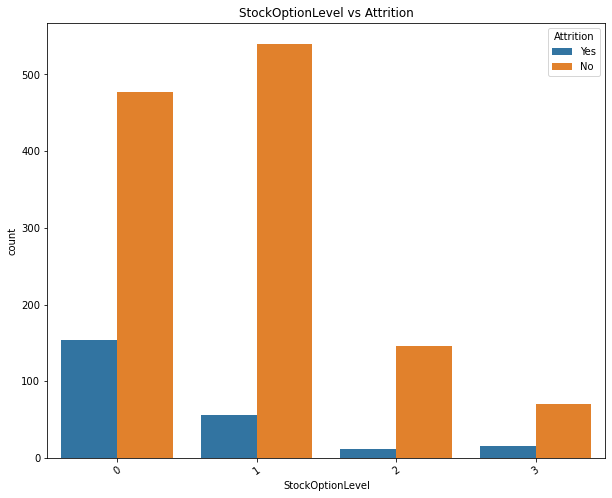

In [86]:
plt.figure(figsize=(10,8))
sns.countplot(x=hrdata_num['StockOptionLevel'],hue=hrdata_cat['Attrition'])
plt.title('StockOptionLevel vs Attrition')
plt.xticks(rotation=35)
plt.show()

Employees with stockoption level at 0 are more likely to leave.

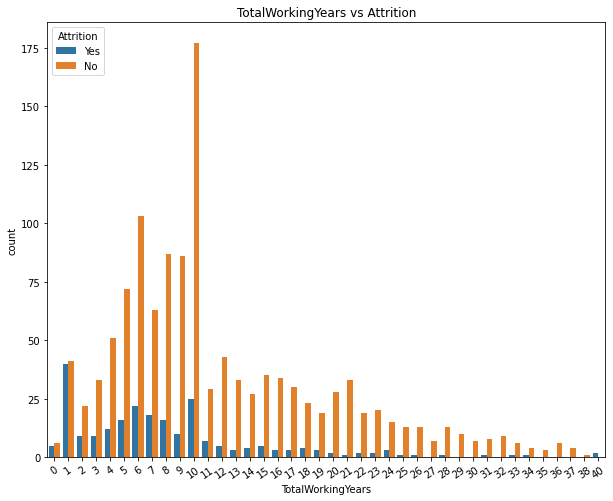

In [87]:
plt.figure(figsize=(10,8))
sns.countplot(x=hrdata_num['TotalWorkingYears'],hue=hrdata_cat['Attrition'])
plt.title('TotalWorkingYears vs Attrition')
plt.xticks(rotation=35)
plt.show()

Employees with 10 years of working experience show high possibility of staying. Highest percentage of attrition i.e. 50% is shown by the ones having 1 year of working experience. Less experienced people are more likely to leave.

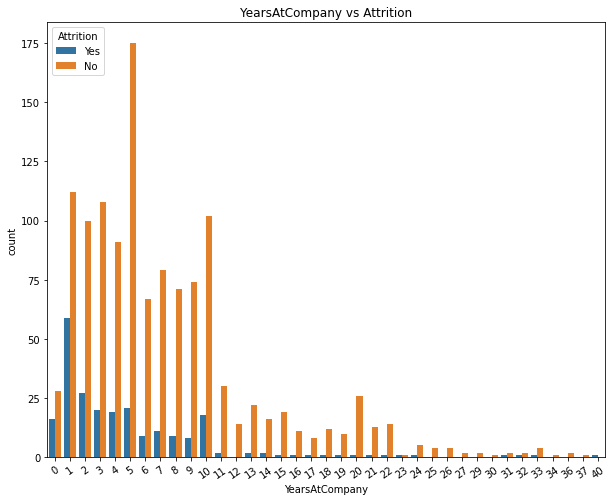

In [91]:
plt.figure(figsize=(10,8))
sns.countplot(x=hrdata_num['YearsAtCompany'],hue=hrdata_cat['Attrition'])
plt.title('YearsAtCompany vs Attrition')
plt.xticks(rotation=35)
plt.show()

Similar to total working experience, working experience in the company also shows that freshers show high attrition while people working in the company for more than 5 years are less likely to leave.

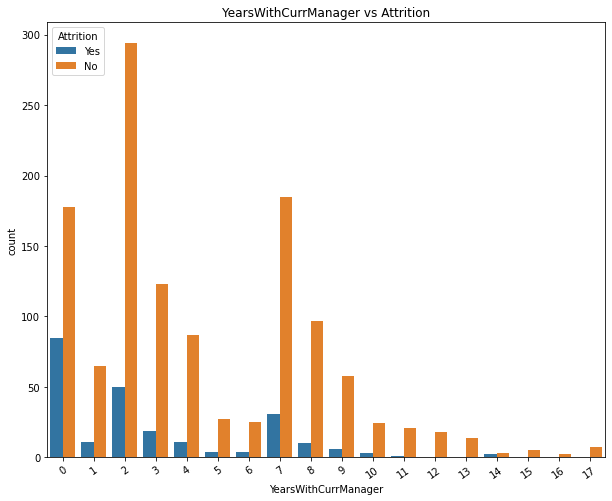

In [94]:
plt.figure(figsize=(10,8))
sns.countplot(x=hrdata_num['YearsWithCurrManager'],hue=hrdata_cat['Attrition'])
plt.title('YearsWithCurrManager vs Attrition')
plt.xticks(rotation=35)
plt.show()

Compatibility with the manager also plays a crucial role. Less compatibility or less time with manager result in employee leaving the company. With more time, compatibility increases and thus possibility of atttrition decreases.

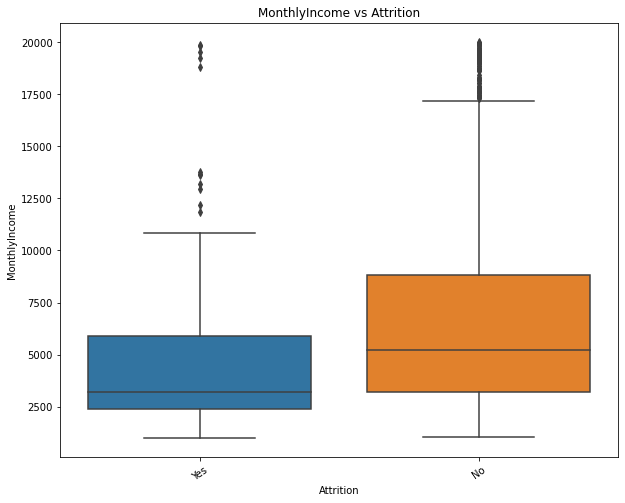

In [117]:
plt.figure(figsize=(10,8))
sns.boxplot(x=hrdata_cat['Attrition'],y=hrdata_num['MonthlyIncome'],orient='v')
plt.title('MonthlyIncome vs Attrition')
plt.xticks(rotation=35)
plt.show()

Less monthly income is a major cause of attrition. Less income also represent freshers. As seen above freshers are more likely to leave looking for a better earning oppurtunity. 

Impact of Categorical Columns on Attrition.

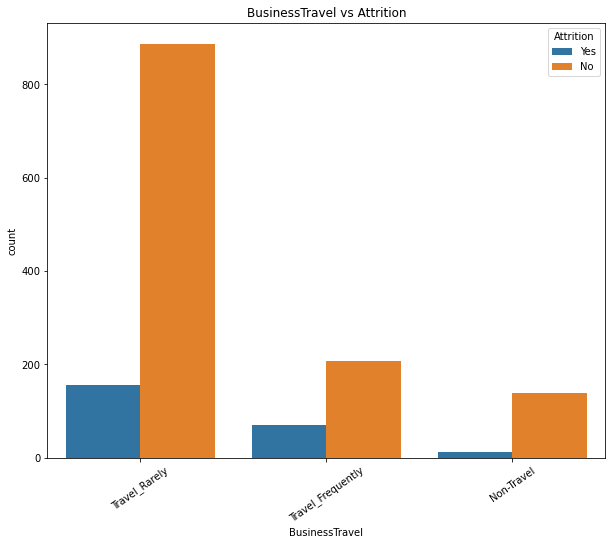

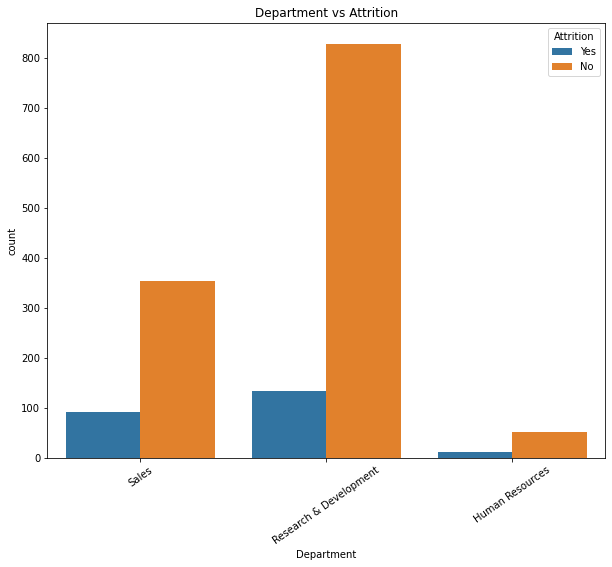

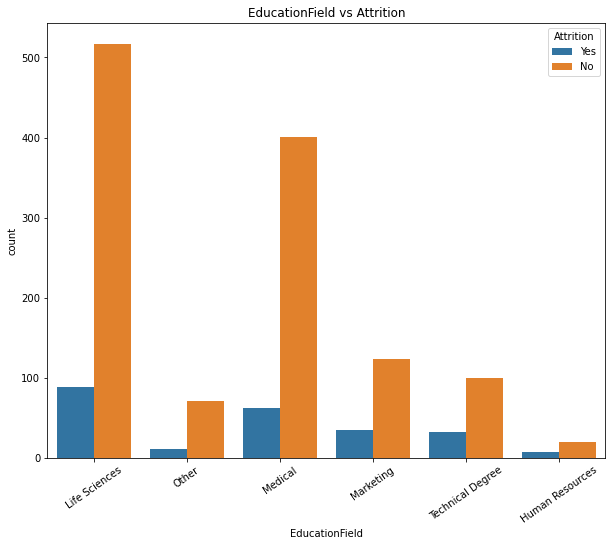

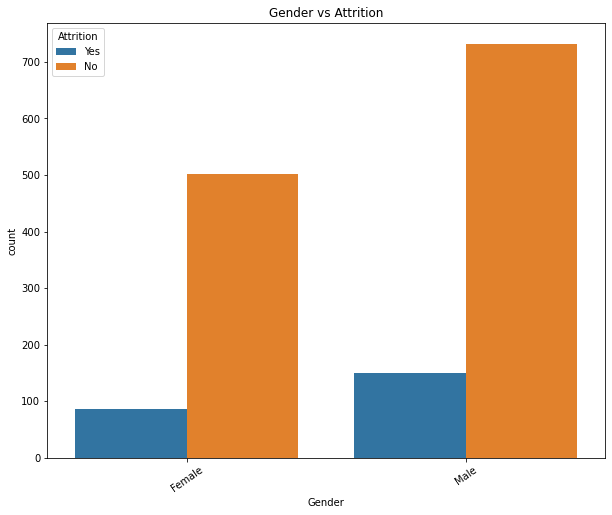

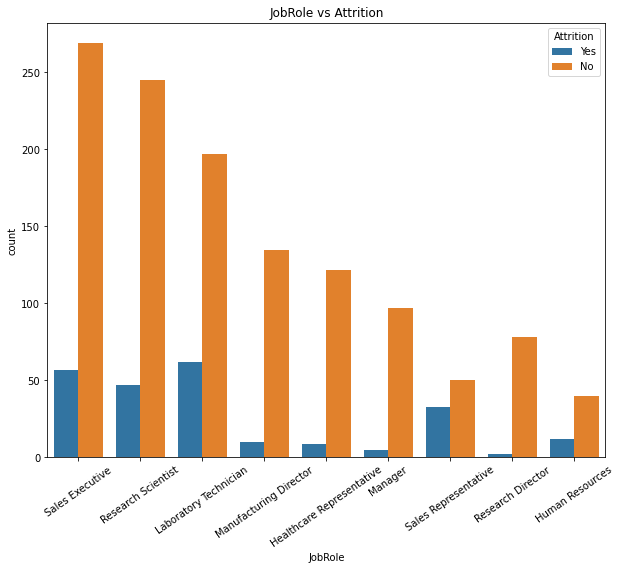

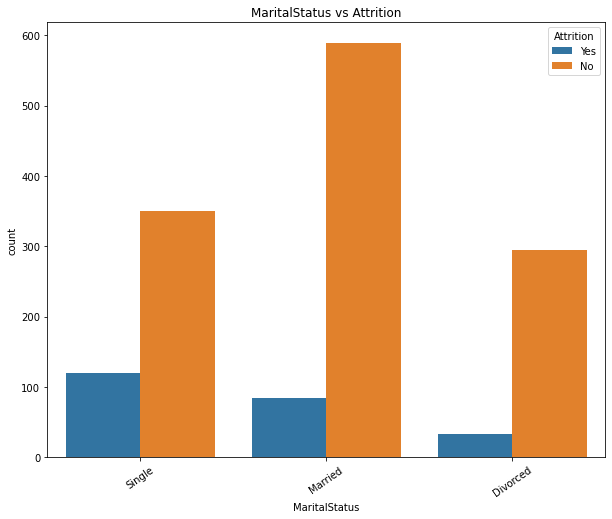

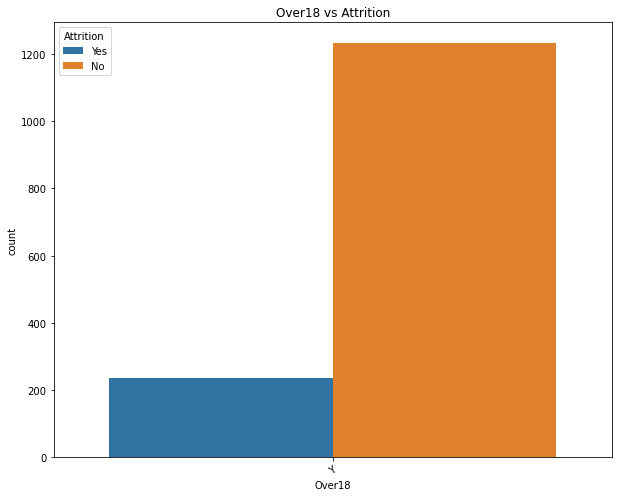

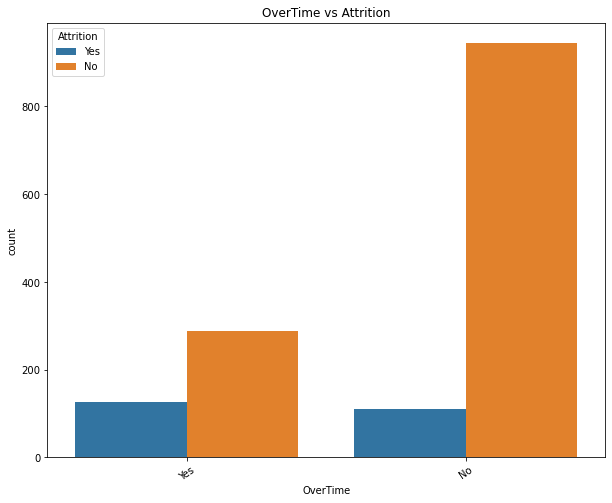

In [130]:
for d in hrdata_cat.iloc[:,1:]:
    plt.figure(figsize=(10,8))
    sns.countplot(x=hrdata_cat[d],hue=hrdata_cat['Attrition'])
    plt.title(f'{d} vs Attrition')
    plt.xticks(rotation=35)
    plt.show()

Observation
1. Employee from medical background show higher attrition
2. Laboratory Technicians are more likely to leave in comparison to other job role
3. Single employees show higher attrition rate.

Encoding Attrition column to check correlation

In [122]:
# Using Ordinal Encoder for changing string values to numeric form
from sklearn.preprocessing import OrdinalEncoder

In [138]:
OE=OrdinalEncoder()
hrdata['Attrition']=OE.fit_transform(hrdata['Attrition'].values.reshape(-1,1))

# Correlation 

In [124]:
hrdata_cor=hrdata.corr()
hrdata_cor

,Age,Attrition,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.010661,-0.001686,0.208034,NaN,-0.010145,0.010146,0.024287,0.029820,0.509604,-0.004892,0.497855,0.028051,0.299635,0.003634,0.001904,0.053535,NaN,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,-0.056652,0.077924,-0.031373,NaN,-0.010577,-0.103369,-0.006846,-0.130016,-0.169105,-0.103481,-0.159840,0.015170,0.043494,-0.013478,0.002889,-0.045872,NaN,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
DailyRate,0.010661,-0.056652,1.000000,-0.004985,-0.016806,NaN,-0.050990,0.018355,0.023381,0.046135,0.002966,0.030571,0.007707,-0.032182,0.038153,0.022704,0.000473,0.007846,NaN,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,0.077924,-0.004985,1.000000,0.021042,NaN,0.032916,-0.016075,0.031131,0.008783,0.005303,-0.003669,-0.017014,0.027473,-0.029251,0.040235,0.027110,0.006557,NaN,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,-0.016806,0.021042,1.000000,NaN,0.042070,-0.027128,0.016775,0.042438,0.101589,-0.011296,0.094961,-0.026084,0.126317,-0.011111,-0.024539,-0.009118,NaN,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.010145,-0.010577,-0.050990,0.032916,0.042070,NaN,1.000000,0.017621,0.035179,-0.006888,-0.018519,-0.046247,-0.014829,0.012648,-0.001251,-0.012944,-0.020359,-0.069861,NaN,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
EnvironmentSatisfaction,0.010146,-0.103369,0.018355,-0.016075,-0.027128,NaN,0.017621,1.000000,-0.049857,-0.008278,0.001212,-0.006784,-0.006259,0.037600,0.012594,-0.031701,-0.029548,0.007665,NaN,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,-0.006846,0.023381,0.031131,0.016775,NaN,0.035179,-0.049857,1.000000,0.042861,-0.027853,-0.071335,-0.015794,-0.015297,0.022157,-0.009062,-0.002172,0.001330,NaN,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,-0.130016,0.046135,0.008783,0.042438,NaN,-0.006888,-0.008278,0.042861,1.000000,-0.012630,-0.021476,-0.015271,-0.016322,0.015012,-0.017205,-0.029071,0.034297,NaN,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976


In [129]:
hrdata_cor['Attrition'].sort_values(ascending=False)

Attrition                   1.000000
DistanceFromHome            0.077924
NumCompaniesWorked          0.043494
MonthlyRate                 0.015170
PerformanceRating           0.002889
HourlyRate                 -0.006846
EmployeeNumber             -0.010577
PercentSalaryHike          -0.013478
Education                  -0.031373
YearsSinceLastPromotion    -0.033019
RelationshipSatisfaction   -0.045872
DailyRate                  -0.056652
TrainingTimesLastYear      -0.059478
WorkLifeBalance            -0.063939
EnvironmentSatisfaction    -0.103369
JobSatisfaction            -0.103481
JobInvolvement             -0.130016
YearsAtCompany             -0.134392
StockOptionLevel           -0.137145
YearsWithCurrManager       -0.156199
Age                        -0.159205
MonthlyIncome              -0.159840
YearsInCurrentRole         -0.160545
JobLevel                   -0.169105
TotalWorkingYears          -0.171063
EmployeeCount                    NaN
StandardHours                    NaN
N

# Checking Outliers

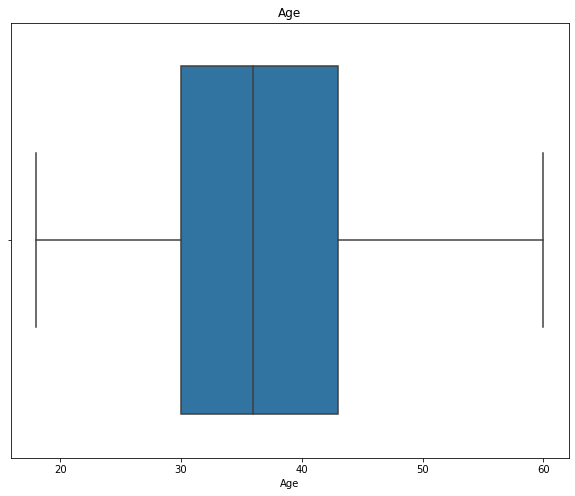

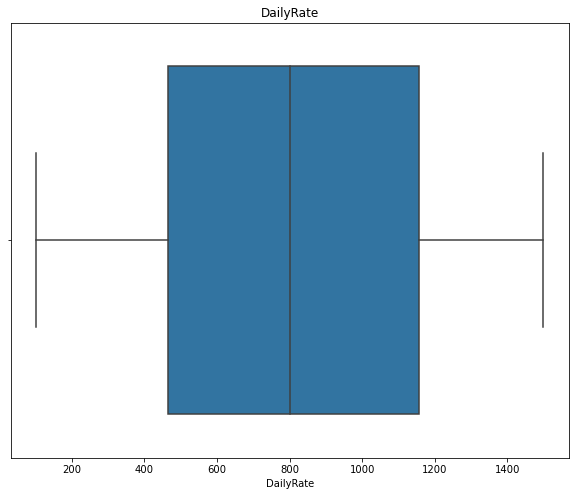

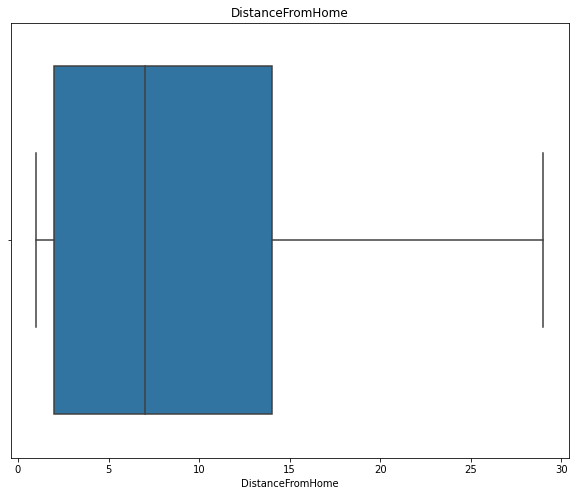

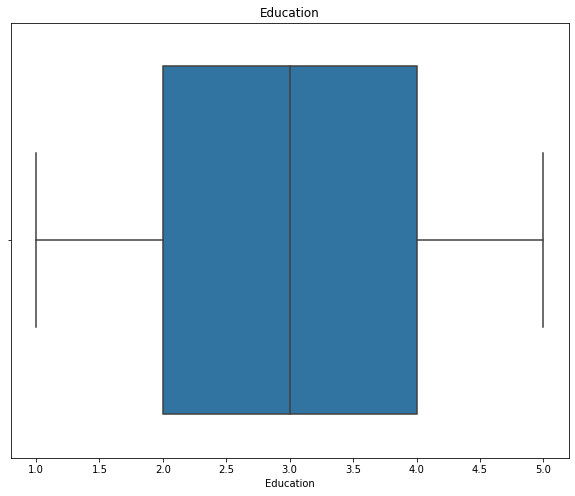

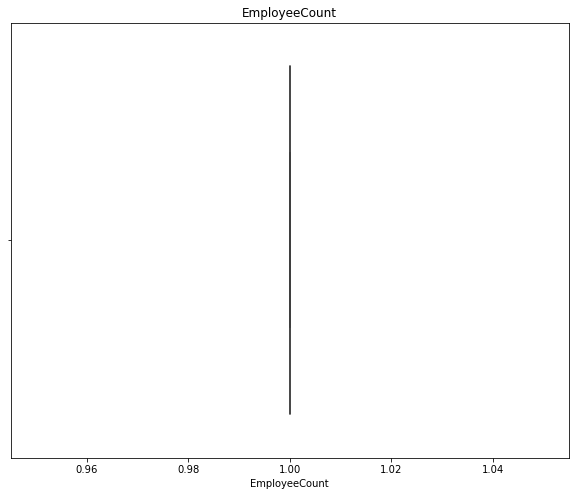

...

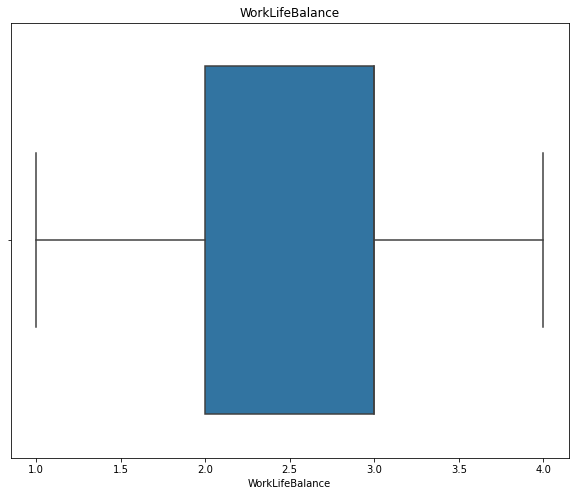

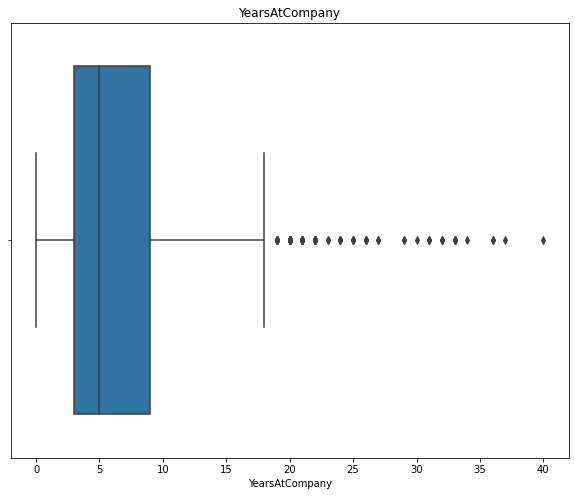

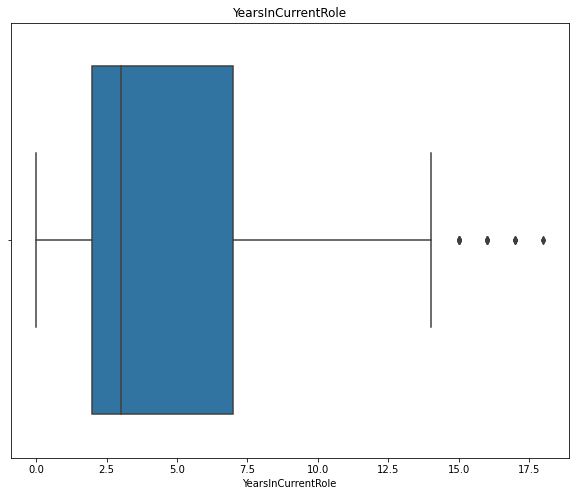

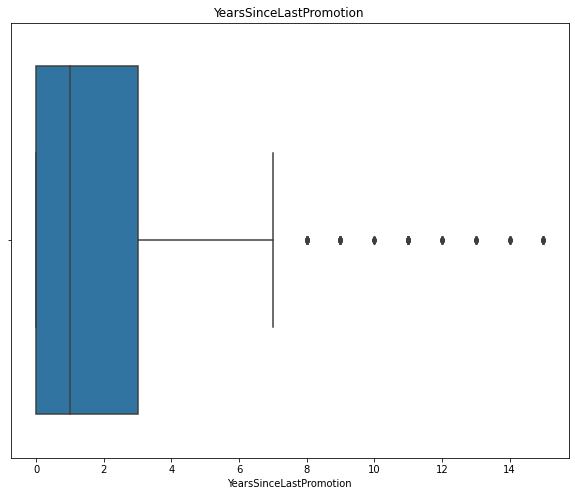

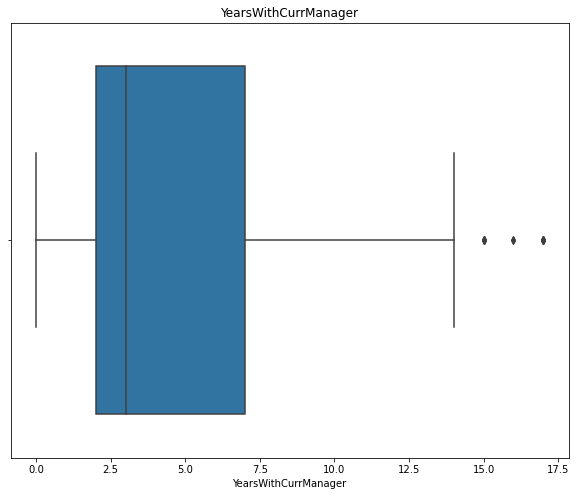

In [26]:
for j in hrdata.columns:
    if hrdata[j].dtypes=='int64':
        plt.figure(figsize=(10,8))
        plt.title(j)
        sns.boxplot(hrdata[j])
        plt.show()

Some outliers are present in the monthly income column. As the values are very close to the whiskers, cannot be considered as extreme outliers.

Thus no outliers re,oving is required here.

# Checking Skewness

In [140]:
hrdata.skew().sort_values(ascending=False)

YearsSinceLastPromotion     1.984290
PerformanceRating           1.921883
Attrition                   1.844366
YearsAtCompany              1.764529
MonthlyIncome               1.369817
TotalWorkingYears           1.117172
NumCompaniesWorked          1.026471
JobLevel                    1.025401
StockOptionLevel            0.968980
DistanceFromHome            0.958118
YearsInCurrentRole          0.917363
YearsWithCurrManager        0.833451
PercentSalaryHike           0.821128
TrainingTimesLastYear       0.553124
Age                         0.413286
MonthlyRate                 0.018578
EmployeeNumber              0.016574
EmployeeCount               0.000000
StandardHours               0.000000
DailyRate                  -0.003519
HourlyRate                 -0.032311
Education                  -0.289681
RelationshipSatisfaction   -0.302828
EnvironmentSatisfaction    -0.321654
JobSatisfaction            -0.329672
JobInvolvement             -0.498419
WorkLifeBalance            -0.552480
d

<Figure size 720x576 with 0 Axes>

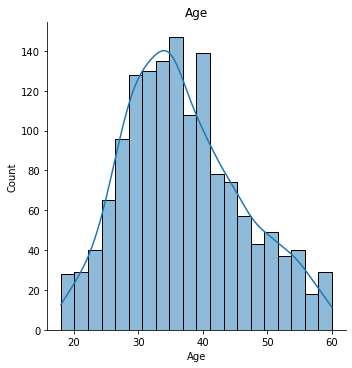

<Figure size 720x576 with 0 Axes>

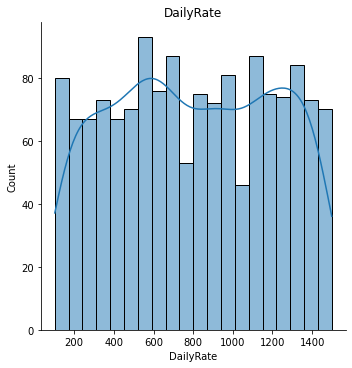

<Figure size 720x576 with 0 Axes>

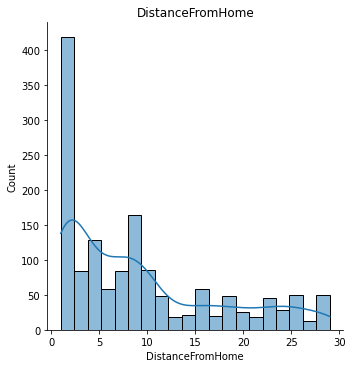

<Figure size 720x576 with 0 Axes>

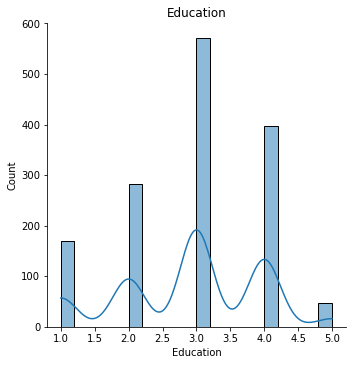

<Figure size 720x576 with 0 Axes>

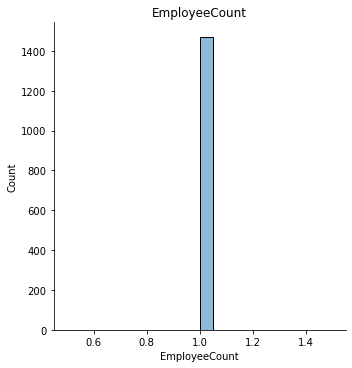

<Figure size 720x576 with 0 Axes>

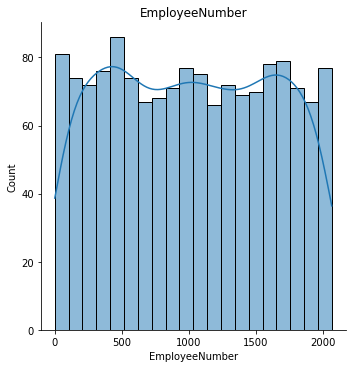

<Figure size 720x576 with 0 Axes>

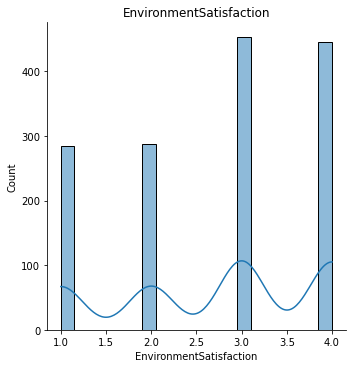

<Figure size 720x576 with 0 Axes>

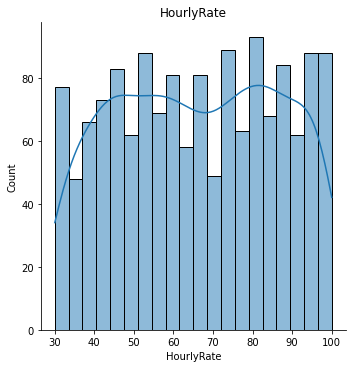

<Figure size 720x576 with 0 Axes>

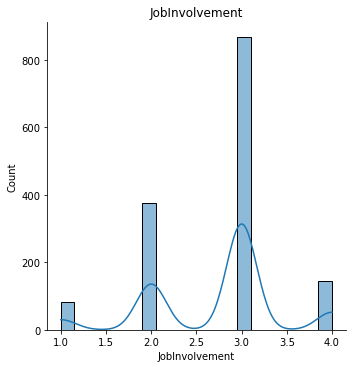

<Figure size 720x576 with 0 Axes>

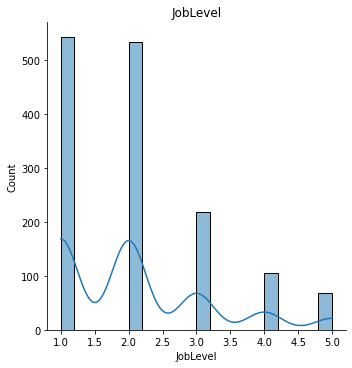

<Figure size 720x576 with 0 Axes>

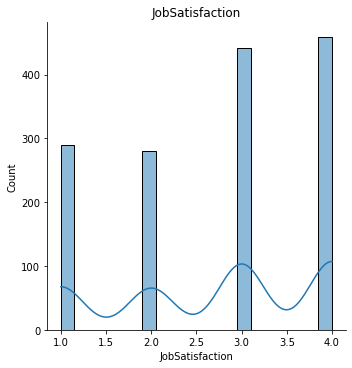

<Figure size 720x576 with 0 Axes>

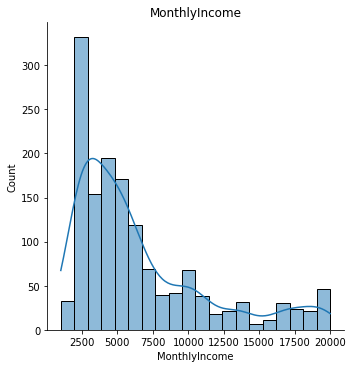

<Figure size 720x576 with 0 Axes>

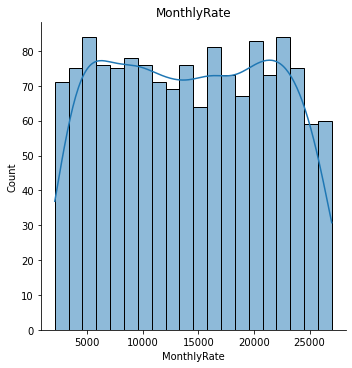

<Figure size 720x576 with 0 Axes>

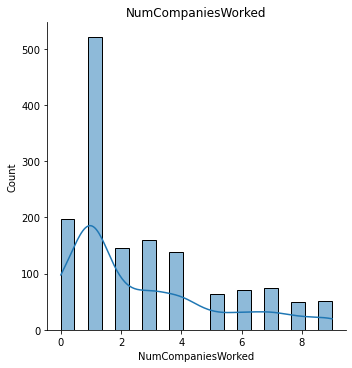

<Figure size 720x576 with 0 Axes>

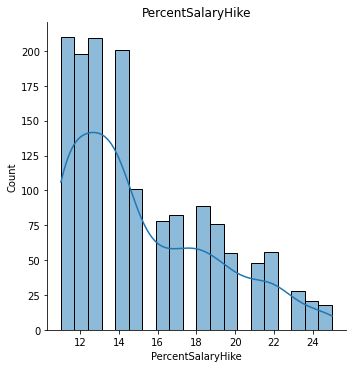

<Figure size 720x576 with 0 Axes>

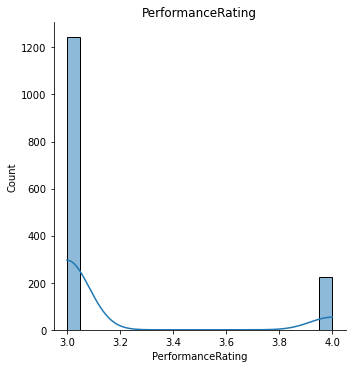

<Figure size 720x576 with 0 Axes>

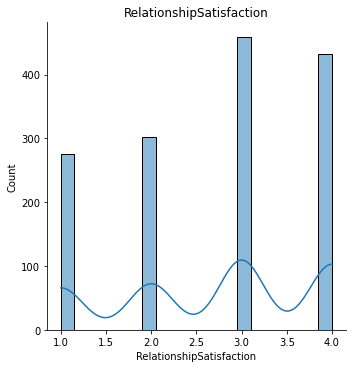

<Figure size 720x576 with 0 Axes>

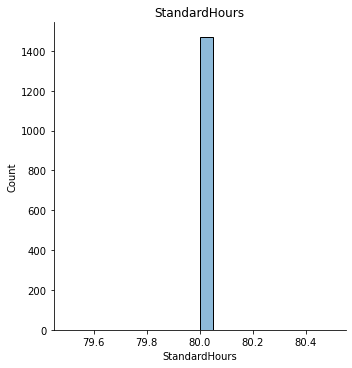

<Figure size 720x576 with 0 Axes>

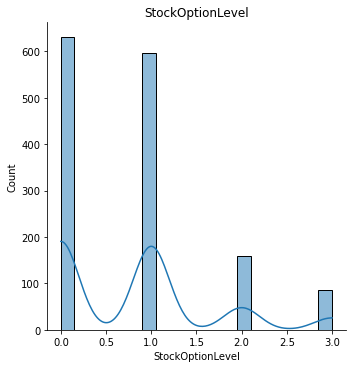

<Figure size 720x576 with 0 Axes>

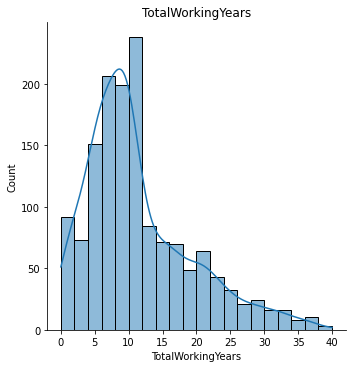

<Figure size 720x576 with 0 Axes>

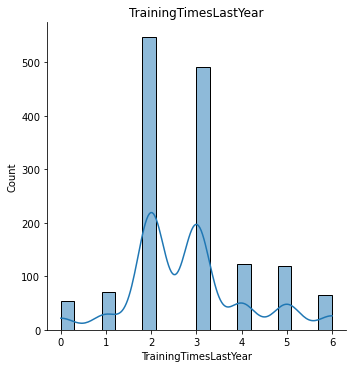

<Figure size 720x576 with 0 Axes>

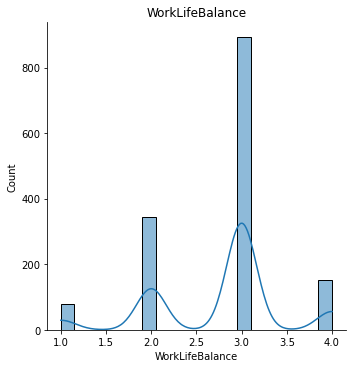

<Figure size 720x576 with 0 Axes>

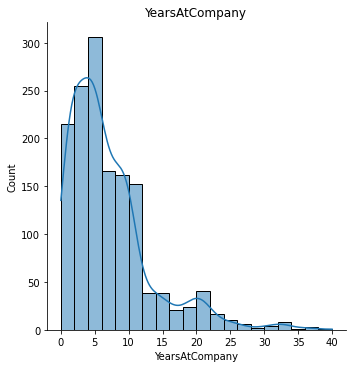

<Figure size 720x576 with 0 Axes>

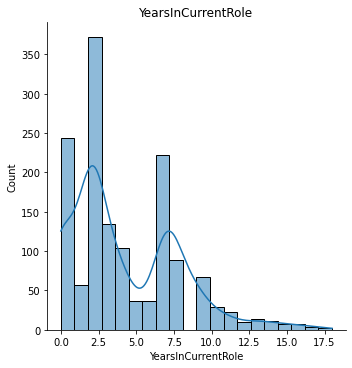

<Figure size 720x576 with 0 Axes>

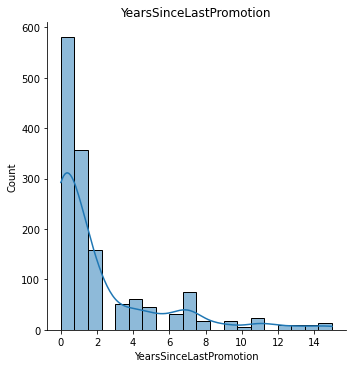

<Figure size 720x576 with 0 Axes>

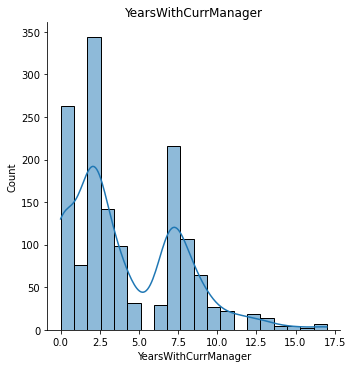

In [132]:
for j in hrdata_num.columns:
    plt.figure(figsize=(10,8))
    sns.displot(hrdata_num[j],kde=True,bins=20)
    plt.title(j)
    plt.show()

Skewness is observed in few columns.

# Skewness Correction

In [141]:
from sklearn.preprocessing import power_transform
from scipy.stats import boxcox

for i in hrdata.iloc[:,0:18]:
    if hrdata[i].dtypes=='int64':
        hrdata[i]=power_transform(hrdata[i].values.reshape(-1,1)) 

In [142]:
for i in hrdata.iloc[:,19:]:
    if hrdata[i].dtypes=='int64':
        hrdata[i]=power_transform(hrdata[i].values.reshape(-1,1)) 

In [143]:
# Treating monthly income with power transform hampers the data we treat in with Boxcox

hrdata['MonthlyIncome']=boxcox(hrdata['MonthlyIncome'],0)

In [144]:
hrdata.skew()

Age                        -0.007603
Attrition                   1.844366
DailyRate                  -0.196160
DistanceFromHome           -0.007468
Education                  -0.099881
EmployeeCount               0.000000
EmployeeNumber             -0.288025
EnvironmentSatisfaction    -0.205395
HourlyRate                 -0.106461
JobInvolvement             -0.020365
JobLevel                    0.103624
JobSatisfaction            -0.212815
MonthlyIncome               0.286192
MonthlyRate                -0.184087
NumCompaniesWorked          0.014814
PercentSalaryHike           0.116250
PerformanceRating           1.921883
RelationshipSatisfaction   -0.193634
StandardHours               0.000000
StockOptionLevel            0.087019
TotalWorkingYears          -0.010653
TrainingTimesLastYear       0.058058
WorkLifeBalance            -0.012286
YearsAtCompany             -0.008683
YearsInCurrentRole         -0.060849
YearsSinceLastPromotion     0.212129
YearsWithCurrManager       -0.067565
d

# Encoding

In [145]:
# Using Ordinal Encoder for changing string values to numeric form
from sklearn.preprocessing import OrdinalEncoder

In [146]:
OE=OrdinalEncoder()

for i in hrdata.columns:
    if hrdata[i].dtypes=='object':
        hrdata[i]=OE.fit_transform(hrdata[i].values.reshape(-1,1))

In [147]:
hrdata

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.522140,1.0,2.0,0.759289,2.0,-1.494085,-0.916940,1.0,0.0,-2.164110,-0.706596,0.0,1.354630,0.326033,0.241622,7.0,1.192743,2.0,8.698347,0.747689,1.621331,0.0,1.0,-1.488918,-0.423557,-1.529513,0.0,-1.087933,-0.244305,-2.579073,-2.144446,0.139692,0.205562,-1.094862,0.490147
1,1.276411,0.0,1.0,-1.334597,1.0,0.243416,-1.771185,1.0,0.0,-2.154174,0.208597,1.0,-0.210675,-1.058710,0.241622,6.0,-0.709062,1.0,8.542861,1.397293,-0.571302,0.0,0.0,1.679689,2.348814,1.229016,0.0,0.548969,0.052495,0.217384,0.276821,0.762660,0.883888,0.096854,0.909635
2,0.102091,1.0,2.0,1.340365,1.0,-1.031215,-0.916940,4.0,0.0,-2.136953,1.209516,1.0,1.263094,-1.058710,-1.170135,2.0,0.197856,2.0,7.644919,-1.882611,1.271339,0.0,1.0,0.201133,-0.423557,-0.700130,0.0,-1.087933,-0.410500,0.217384,0.276821,-2.229592,-1.596434,-1.094862,-1.550156
3,-0.353971,0.0,1.0,1.379936,1.0,-0.700347,1.082871,1.0,0.0,-2.129176,1.209516,0.0,-0.460197,0.326033,-1.170135,6.0,0.197856,1.0,7.975565,1.193001,-0.571302,0.0,1.0,-1.488918,-0.423557,0.225164,0.0,-1.087933,-0.244305,0.217384,0.276821,0.482432,0.883888,0.905592,-1.550156
4,-1.123755,0.0,2.0,-0.453941,1.0,-1.031215,-1.771185,3.0,0.0,-2.114724,-1.518118,1.0,-1.289301,0.326033,-1.170135,2.0,-0.709062,1.0,8.151333,0.386371,1.766182,0.0,0.0,-0.948760,-0.423557,1.229016,0.0,0.548969,-0.592063,0.217384,0.276821,-0.951540,-0.446645,0.607464,-0.406881
5,-0.474486,0.0,1.0,0.542641,1.0,-1.031215,-0.916940,1.0,0.0,-2.107926,1.209516,1.0,0.658558,0.326033,-1.170135,2.0,1.192743,2.0,8.028781,-0.262208,-1.664787,0.0,0.0,-0.499665,-0.423557,0.225164,0.0,-1.087933,-0.244305,-0.578785,-1.108624,0.320677,0.883888,0.905592,0.711239
6,2.096797,0.0,2.0,1.237656,1.0,-0.700347,0.040522,3.0,0.0,-2.094986,0.208597,0.0,0.752706,2.014107,-1.170135,2.0,-1.509980,1.0,7.889834,-0.540864,0.792695,0.0,1.0,1.281630,2.348814,-1.529513,0.0,1.785018,0.313335,0.217384,-1.108624,-1.440442,-1.596434,-1.094862,-1.550156
7,-0.724322,0.0,2.0,1.309025,1.0,1.456094,-1.771185,1.0,0.0,-2.088793,1.209516,1.0,0.083791,0.326033,-1.170135,2.0,0.197856,0.0,7.898411,-0.055238,-0.571302,0.0,0.0,1.560773,2.348814,-0.700130,0.0,0.548969,-1.988249,-0.578785,0.276821,-1.440442,-1.596434,-1.094862,-1.550156
8,0.210221,0.0,1.0,-1.538767,1.0,1.407126,0.040522,1.0,0.0,-2.082756,1.209516,1.0,-1.077039,-1.058710,1.009822,4.0,0.197856,2.0,9.161780,-0.721141,-1.664787,0.0,0.0,1.428797,2.348814,-0.700130,0.0,-1.087933,0.052495,-0.578785,0.276821,0.628829,0.883888,0.096854,1.090110
9,-0.008279,0.0,2.0,1.184879,1.0,1.592263,0.040522,3.0,0.0,-2.076861,0.208597,1.0,1.354630,0.326033,0.241622,0.0,0.197856,1.0,8.563504,0.379223,1.271339,0.0,0.0,-0.499665,-0.423557,-0.700130,0.0,1.313755,0.859893,0.217384,-1.108624,0.320677,0.883888,1.454429,0.909635


# Splitting Input and Target Variables and dropping non relevant columns

In [148]:
x=hrdata.drop(['Attrition','EmployeeCount','Over18'],axis=1)
y=hrdata['Attrition']
print(x.head())
print(y.head())
print(x.shape)
print(y.shape)

        Age  BusinessTravel  DailyRate  Department  DistanceFromHome  \
0  0.522140             2.0   0.759289         2.0         -1.494085   
1  1.276411             1.0  -1.334597         1.0          0.243416   
2  0.102091             2.0   1.340365         1.0         -1.031215   
3 -0.353971             1.0   1.379936         1.0         -0.700347   
4 -1.123755             2.0  -0.453941         1.0         -1.031215   

   Education  EducationField  EmployeeNumber  EnvironmentSatisfaction  Gender  \
0  -0.916940             1.0       -2.164110                -0.706596     0.0   
1  -1.771185             1.0       -2.154174                 0.208597     1.0   
2  -0.916940             4.0       -2.136953                 1.209516     1.0   
3   1.082871             1.0       -2.129176                 1.209516     0.0   
4  -1.771185             3.0       -2.114724                -1.518118     1.0   

   HourlyRate  JobInvolvement  JobLevel  JobRole  JobSatisfaction  \
0    1.3546

# Scaling 

In [152]:
# As pu target variable is having values 0 and 1 we will scale rest of the data between 0 and 1 using MinMax Scaler

from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler()

In [150]:
x_new=mms.fit_transform(x)

In [151]:
x=pd.DataFrame(x_new,columns=x.columns)
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.651664,1.0,0.763462,1.0,0.000000,0.215204,0.2,0.000000,0.297518,0.0,0.921380,0.591733,0.468463,0.875,1.000000,1.0,0.596518,0.752350,0.957781,1.0,0.000000,0.0,0.000000,0.0,0.000000,0.458154,0.000000,0.000000,0.475475,0.455329,0.000000,0.534835
1,0.810835,0.5,0.174523,0.5,0.548210,0.000000,0.2,0.002678,0.633045,1.0,0.469701,0.256828,0.468463,0.750,0.296337,0.5,0.544458,0.933358,0.318710,0.0,0.939124,1.0,1.000000,0.0,0.569763,0.516731,0.579282,0.584477,0.600494,0.626729,0.407877,0.644798
2,0.563023,1.0,0.926899,0.5,0.146043,0.215204,0.8,0.007320,1.000000,1.0,0.894966,0.256828,0.000000,0.250,0.631895,1.0,0.243814,0.019429,0.855772,1.0,0.500904,0.0,0.300661,0.0,0.000000,0.425354,0.579282,0.584477,0.000000,0.000000,0.000000,0.000000
3,0.466782,0.5,0.938029,0.5,0.250437,0.719004,0.2,0.009417,1.000000,0.0,0.397700,0.591733,0.000000,0.750,0.631895,0.5,0.354519,0.876434,0.318710,1.0,0.000000,0.0,0.636091,0.0,0.000000,0.458154,0.579282,0.584477,0.544257,0.626729,0.684677,0.000000
4,0.304337,1.0,0.422222,0.5,0.146043,0.000000,0.6,0.013312,0.000000,1.0,0.158457,0.591733,0.000000,0.250,0.296337,0.5,0.413369,0.651670,1.000000,0.0,0.160094,0.0,1.000000,0.0,0.569763,0.389521,0.579282,0.584477,0.256483,0.290529,0.582639,0.299693
5,0.441350,0.5,0.702526,0.5,0.146043,0.215204,0.2,0.015145,1.000000,1.0,0.720524,0.591733,0.000000,0.250,1.000000,1.0,0.372337,0.470947,0.000000,0.0,0.293199,0.0,0.636091,0.0,0.000000,0.458154,0.414357,0.250040,0.511796,0.626729,0.684677,0.592791
6,0.983958,1.0,0.898011,0.5,0.250437,0.456411,0.6,0.018632,0.633045,0.0,0.747691,1.000000,0.000000,0.250,0.000000,0.5,0.325815,0.393301,0.716265,1.0,0.821146,1.0,0.000000,0.0,1.000000,0.568210,0.579282,0.250040,0.158369,0.000000,0.000000,0.000000
7,0.388628,1.0,0.918084,0.5,0.930830,0.000000,0.2,0.020302,1.000000,1.0,0.554671,0.591733,0.000000,0.250,0.631895,0.0,0.328687,0.528618,0.318710,0.0,0.903879,1.0,0.300661,0.0,0.569763,0.113969,0.414357,0.584477,0.158369,0.000000,0.000000,0.000000
8,0.585841,0.5,0.117097,0.5,0.915380,0.456411,0.2,0.021929,1.000000,1.0,0.219706,0.256828,0.723375,0.500,0.631895,1.0,0.751682,0.343067,0.000000,0.0,0.864764,1.0,0.300661,0.0,0.000000,0.516731,0.414357,0.584477,0.573636,0.626729,0.407877,0.692107
9,0.539732,1.0,0.883166,0.5,0.973793,0.456411,0.6,0.023518,0.633045,1.0,0.921380,0.591733,0.468463,0.000,0.631895,0.5,0.551370,0.649678,0.855772,0.0,0.293199,0.0,0.300661,0.0,0.835966,0.676079,0.579282,0.250040,0.511796,0.626729,0.872522,0.644798


In [153]:
# Importing Classification Algorithms
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

# Finding Best Random State

In [154]:
maxAccu=0
maxRs=0
for i in range(1,500):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    lrpred=lr.predict(x_test)
    acc=accuracy_score(y_test,lrpred)
    if acc>maxAccu:
        maxAccu=acc
        maxRs=i
print('Best Accuracy Score is : ', maxAccu, ' when Random state is : ',maxRs)

Best Accuracy Score is :  0.9160997732426304  when Random state is :  123


In [155]:
# Using Random State 123

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=123)

# Checking for Best model

In [156]:
# Defining Model List
model_list=[LogisticRegression(),SVC(),DecisionTreeClassifier(),KNeighborsClassifier(),RandomForestClassifier(),AdaBoostClassifier(),GaussianNB(),XGBClassifier()]

In [157]:
# Creating For loop to print Training and Test accuracy score
for m in model_list:
    model=m
    model.fit(x_train,y_train)
    model_pred_train=model.predict(x_train)
    model_pred=model.predict(x_test)
    print('Training Accuracy for the model ',m,' is: ',accuracy_score(y_train,model_pred_train))
    print('Testing Accuracy for the model ',m,' is: ',accuracy_score(y_test,model_pred))
    print('\n')
    

Training Accuracy for the model  LogisticRegression()  is:  0.8649173955296404
Testing Accuracy for the model  LogisticRegression()  is:  0.9160997732426304


Training Accuracy for the model  SVC()  is:  0.8892128279883382
Testing Accuracy for the model  SVC()  is:  0.9024943310657596


Training Accuracy for the model  DecisionTreeClassifier()  is:  1.0
Testing Accuracy for the model  DecisionTreeClassifier()  is:  0.7936507936507936


Training Accuracy for the model  KNeighborsClassifier()  is:  0.8600583090379009
Testing Accuracy for the model  KNeighborsClassifier()  is:  0.8752834467120182


Training Accuracy for the model  RandomForestClassifier()  is:  1.0
Testing Accuracy for the model  RandomForestClassifier()  is:  0.8888888888888888


Training Accuracy for the model  AdaBoostClassifier()  is:  0.8872691933916423
Testing Accuracy for the model  AdaBoostClassifier()  is:  0.9047619047619048


Training Accuracy for the model  GaussianNB()  is:  0.8066083576287658
Testing Accurac

# Cross Validating the models

In [158]:
from sklearn.model_selection import cross_val_score

In [159]:
# Logistic Regression
lr=LogisticRegression()
lr.fit(x_train,y_train)
lr_pred=lr.predict(x_test)
testing_accu=accuracy_score(y_test,lr_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(LogisticRegression(),x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 87.21088435374149 and the accuracy for testing is 91.60997732426304 


At crossfold 3 the CV score of is 87.00680272108843 and the accuracy for testing is 91.60997732426304 


At crossfold 4 the CV score of is 86.87118676697074 and the accuracy for testing is 91.60997732426304 


At crossfold 5 the CV score of is 87.07482993197277 and the accuracy for testing is 91.60997732426304 


At crossfold 6 the CV score of is 87.00680272108845 and the accuracy for testing is 91.60997732426304 


At crossfold 7 the CV score of is 87.14285714285714 and the accuracy for testing is 91.60997732426304 


At crossfold 8 the CV score of is 87.142878355904 and the accuracy for testing is 91.60997732426304 


At crossfold 9 the CV score of is 87.00558631353184 and the accuracy for testing is 91.60997732426304 




In [160]:
# SVC
svc=SVC()
svc.fit(x_train,y_train)
svc_pred=svc.predict(x_test)
testing_accu=accuracy_score(y_test,svc_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(svc,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 85.37414965986395 and the accuracy for testing is 90.24943310657596 


At crossfold 3 the CV score of is 86.4625850340136 and the accuracy for testing is 90.24943310657596 


At crossfold 4 the CV score of is 86.19054318208742 and the accuracy for testing is 90.24943310657596 


At crossfold 5 the CV score of is 86.53061224489797 and the accuracy for testing is 90.24943310657596 


At crossfold 6 the CV score of is 86.53061224489797 and the accuracy for testing is 90.24943310657596 


At crossfold 7 the CV score of is 86.80272108843538 and the accuracy for testing is 90.24943310657596 


At crossfold 8 the CV score of is 86.8715104537895 and the accuracy for testing is 90.24943310657596 


At crossfold 9 the CV score of is 86.53091592265616 and the accuracy for testing is 90.24943310657596 




In [161]:
# DecisionTreeClassifier
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
dtc_pred=dtc.predict(x_test)
testing_accu=accuracy_score(y_test,dtc_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(dtc,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 75.03401360544217 and the accuracy for testing is 78.00453514739229 


At crossfold 3 the CV score of is 79.93197278911565 and the accuracy for testing is 78.00453514739229 


At crossfold 4 the CV score of is 78.2319926548987 and the accuracy for testing is 78.00453514739229 


At crossfold 5 the CV score of is 77.07482993197279 and the accuracy for testing is 78.00453514739229 


At crossfold 6 the CV score of is 77.48299319727892 and the accuracy for testing is 78.00453514739229 


At crossfold 7 the CV score of is 74.48979591836734 and the accuracy for testing is 78.00453514739229 


At crossfold 8 the CV score of is 78.02810940841056 and the accuracy for testing is 78.00453514739229 


At crossfold 9 the CV score of is 76.5354049246014 and the accuracy for testing is 78.00453514739229 




In [162]:
# KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
knn_pred=knn.predict(x_test)
testing_accu=accuracy_score(y_test,knn_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(knn,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 84.421768707483 and the accuracy for testing is 87.52834467120182 


At crossfold 3 the CV score of is 84.82993197278913 and the accuracy for testing is 87.52834467120182 


At crossfold 4 the CV score of is 84.8981163369269 and the accuracy for testing is 87.52834467120182 


At crossfold 5 the CV score of is 84.89795918367348 and the accuracy for testing is 87.52834467120182 


At crossfold 6 the CV score of is 84.82993197278913 and the accuracy for testing is 87.52834467120182 


At crossfold 7 the CV score of is 84.89795918367348 and the accuracy for testing is 87.52834467120182 


At crossfold 8 the CV score of is 84.96599548586362 and the accuracy for testing is 87.52834467120182 


At crossfold 9 the CV score of is 85.37375097677358 and the accuracy for testing is 87.52834467120182 




In [163]:
# RandomForestClassifier
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)
rfc_pred=rfc.predict(x_test)
testing_accu=accuracy_score(y_test,rfc_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(rfc,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 85.64625850340136 and the accuracy for testing is 89.79591836734694 


At crossfold 3 the CV score of is 85.78231292517006 and the accuracy for testing is 89.79591836734694 


At crossfold 4 the CV score of is 86.05374807487264 and the accuracy for testing is 89.79591836734694 


At crossfold 5 the CV score of is 85.98639455782312 and the accuracy for testing is 89.79591836734694 


At crossfold 6 the CV score of is 85.78231292517006 and the accuracy for testing is 89.79591836734694 


At crossfold 7 the CV score of is 85.78231292517006 and the accuracy for testing is 89.79591836734694 


At crossfold 8 the CV score of is 85.9200522689475 and the accuracy for testing is 89.79591836734694 


At crossfold 9 the CV score of is 85.17008329592498 and the accuracy for testing is 89.79591836734694 




In [164]:
# AdaBoostClassifier
adb=AdaBoostClassifier()
adb.fit(x_train,y_train)
adb_pred=adb.predict(x_test)
testing_accu=accuracy_score(y_test,adb_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(adb,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 85.71428571428572 and the accuracy for testing is 90.47619047619048 


At crossfold 3 the CV score of is 85.03401360544217 and the accuracy for testing is 90.47619047619048 


At crossfold 4 the CV score of is 85.23742003317143 and the accuracy for testing is 90.47619047619048 


At crossfold 5 the CV score of is 85.71428571428571 and the accuracy for testing is 90.47619047619048 


At crossfold 6 the CV score of is 87.00680272108843 and the accuracy for testing is 90.47619047619048 


At crossfold 7 the CV score of is 86.25850340136054 and the accuracy for testing is 90.47619047619048 


At crossfold 8 the CV score of is 87.07679971489665 and the accuracy for testing is 90.47619047619048 


At crossfold 9 the CV score of is 85.71582955093355 and the accuracy for testing is 90.47619047619048 




In [165]:
# GaussianNB
gnb=GaussianNB()
gnb.fit(x_train,y_train)
gnb_pred=gnb.predict(x_test)
testing_accu=accuracy_score(y_test,gnb_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(gnb,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 77.9591836734694 and the accuracy for testing is 82.31292517006803 


At crossfold 3 the CV score of is 81.7687074829932 and the accuracy for testing is 82.31292517006803 


At crossfold 4 the CV score of is 82.44802156142637 and the accuracy for testing is 82.31292517006803 


At crossfold 5 the CV score of is 82.10884353741497 and the accuracy for testing is 82.31292517006803 


At crossfold 6 the CV score of is 81.56462585034015 and the accuracy for testing is 82.31292517006803 


At crossfold 7 the CV score of is 81.56462585034012 and the accuracy for testing is 82.31292517006803 


At crossfold 8 the CV score of is 81.56740021382751 and the accuracy for testing is 82.31292517006803 


At crossfold 9 the CV score of is 81.35650988411724 and the accuracy for testing is 82.31292517006803 




In [166]:
# XGBClassifier
xgb=XGBClassifier()
xgb.fit(x_train,y_train)
xgb_pred=xgb.predict(x_test)
testing_accu=accuracy_score(y_test,xgb_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(xgb,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

[03:03:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:03:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:03:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
At crossfold 2 the CV score of is 85.71428571428572 and the accuracy f

[03:03:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
At crossfold 7 the CV score of is 86.73469387755102 and the accuracy for testing is 89.56916099773242 


[03:03:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:03:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd

Observing the cross validation scores of above models we can see GaussianNB has the best result among all as it does not show over or under fitting. We will further hyper tune to see any improvement.

# Hypertuning the model

In [168]:
# Using GridSearchCV

from sklearn.model_selection import GridSearchCV

In [169]:
params_gnb = {'var_smoothing': np.logspace(0,-9, num=100)}
gnb_p = GridSearchCV(estimator=gnb, 
                 param_grid=params_gnb, 
                 cv=5,   # use any cross validation technique 
                 verbose=1, 
                 scoring='accuracy') 
gnb_p.fit(x_train, y_train)

gnb_p.best_params_

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    1.4s finished


{'var_smoothing': 0.23101297000831597}

Training model with best parameters and cross validating it

In [170]:
# GaussianNB
gnb_t=GaussianNB(var_smoothing=0.23)
gnb_t.fit(x_train,y_train)
gnb_t_pred=gnb_t.predict(x_test)
testing_accu=accuracy_score(y_test,gnb_t_pred)*100
for k in range(2,10):
    cv_score=cross_val_score(gnb_t,x,y,cv=k)
    cv_mean=cv_score.mean()*100
    print(f'At crossfold {k} the CV score of is {cv_mean} and the accuracy for testing is {testing_accu} ')
    print('\n')

At crossfold 2 the CV score of is 85.91836734693878 and the accuracy for testing is 89.56916099773242 


At crossfold 3 the CV score of is 86.12244897959184 and the accuracy for testing is 89.56916099773242 


At crossfold 4 the CV score of is 86.25847796469614 and the accuracy for testing is 89.56916099773242 


At crossfold 5 the CV score of is 86.25850340136054 and the accuracy for testing is 89.56916099773242 


At crossfold 6 the CV score of is 86.3265306122449 and the accuracy for testing is 89.56916099773242 


At crossfold 7 the CV score of is 86.32653061224492 and the accuracy for testing is 89.56916099773242 


At crossfold 8 the CV score of is 86.39670943216916 and the accuracy for testing is 89.56916099773242 


At crossfold 9 the CV score of is 86.25741932265947 and the accuracy for testing is 89.56916099773242 




As we see tuning the model do increase accuracy but also show overfitting. Its better to train the model with default parameters.

In [172]:
# Training the model

gnb=GaussianNB()
gnb.fit(x_train,y_train)
gnb_pred=gnb.predict(x_test)
print('Accuracy Score of the model is : ',accuracy_score(y_test,gnb_pred)*100,'\n')

cv_score=cross_val_score(gnb,x,y,cv=5)
cv_mean=cv_score.mean()*100
print(f'At crossfold 4 the CV score is {cv_mean}\n')

print('Confusion matrix : \n',confusion_matrix(y_test,gnb_pred)*100,'\n')
print('Classification report of the model : \n',classification_report(y_test,gnb_pred))

Accuracy Score of the model is :  82.31292517006803 

At crossfold 4 the CV score is 82.10884353741497

Confusion matrix : 
 [[33200  5200]
 [ 2600  3100]] 

Classification report of the model : 
               precision    recall  f1-score   support

         0.0       0.93      0.86      0.89       384
         1.0       0.37      0.54      0.44        57

    accuracy                           0.82       441
   macro avg       0.65      0.70      0.67       441
weighted avg       0.86      0.82      0.84       441



In [173]:
gnb

GaussianNB()

# Plotting the Auc Roc Curve

In [174]:
from sklearn.metrics import roc_curve,roc_auc_score

In [175]:
y_pred_prob=gnb.predict_proba(x_test)[:,1]
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

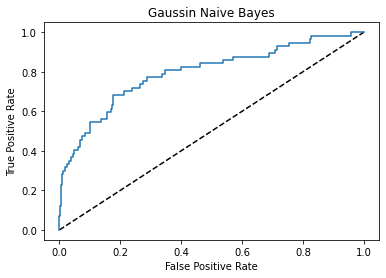

In [176]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label='Gaussin Naive Bayes')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Gaussin Naive Bayes')
plt.show()

In [177]:
# Auc score

auc_score=roc_auc_score(y_test,y_pred_prob)*100
auc_score

79.5641447368421

# Saving the best model

In [178]:
# Using Pickle

import pickle
filename='hrdata.pkl'
pickle.dump(gnb,open(filename,'wb'))

# Conclusion

In [179]:
#loading saved model

load_model=pickle.load(open('hrdata.pkl','rb'))

In [180]:
# Checking score of the model

result=load_model.score(x_test,y_test)
print(result)

0.8231292517006803


In [181]:
#Checking model algorithm

load_model

GaussianNB()

In [182]:
# Creating dataframe of Test and Predicted data

conclusion=pd.DataFrame([load_model.predict(x_test)[:],gnb_pred[:]],index=['Predicted','Original'])

In [183]:
# Checking the dataframe

conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440
Predicted,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
Original,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.